# Object Detection using TAO EfficientDet

Transfer learning is the process of transferring learned features from one application to another. It is a commonly used training technique where you use a model trained on one task and re-train to use it on a different task. 

Train Adapt Optimize (TAO) Toolkit  is a simple and easy-to-use Python based AI toolkit for taking purpose-built AI models and customizing them with users' own data.

<img align="center" src="https://developer.nvidia.com/sites/default/files/akamai/embedded-transfer-learning-toolkit-software-stack-1200x670px.png" width="1080">


## Learning Objectives
In this notebook, you will learn how to leverage the simplicity and convenience of TAO to:

* Take a pretrained model and train a EfficientDet-D0 modelon the Custom(Raccoon) COCO dataset
* Evaluate the trained model
* Run pruning and finetuning with the trained model
* Run inference with the trained model and visualize the result
* Export the trained model to a .etlt file for deployment to DeepStream
* Run inference on the exported .etlt model to verify deployment using TensorRT

## Table of Contents

This notebook shows an example use case of YOLO v4 Tiny object detection using Train Adapt Optimize (TAO) Toolkit.

0. [Set up env variables and map drives](#head-0)
1. [Install the TAO launcher](#head-1)
2. [Prepare dataset and pre-trained model](#head-2) <br>
     2.1 [Prepare dataset](#head-2-1)<br>
     2.2 [Download pretrained model](#head-2-2)
3. [Provide training specification](#head-3)
4. [Run TAO training](#head-4)
5. [Evaluate trained models](#head-5)
6. [Prune trained model](#head-6)
7. [Retrain pruned models](#head-7)
8. [Evaluate retrained model](#head-8)
9. [Visualize inferences](#head-9)
10. [Deploy](#head-10)
11. [Verify the deployed model](#head-11)

## 0. Set up env variables and map drives <a class="anchor" id="head-0"></a>

When using the purpose-built pretrained models from NGC, please make sure to set the `$KEY` environment variable to the key as mentioned in the model overview. Failing to do so, can lead to errors when trying to load them as pretrained models.

The following notebook requires the user to set an env variable called the `$LOCAL_PROJECT_DIR` as the path to the users workspace. Please note that the dataset to run this notebook is expected to reside in the `$LOCAL_PROJECT_DIR/data`, while the TAO experiment generated collaterals will be output to `$LOCAL_PROJECT_DIR/yolo_v4_tiny`. More information on how to set up the dataset and the supported steps in the TAO workflow are provided in the subsequent cells.

*Note: Please make sure to remove any stray artifacts/files from the `$USER_EXPERIMENT_DIR` or `$DATA_DOWNLOAD_DIR` paths as mentioned below, that may have been generated from previous experiments. Having checkpoint files etc may interfere with creating a training graph for a new experiment.*

In [1]:
# Setting up env variables for cleaner command line commands.
import os

print("Please replace the variable with your key.")
%env KEY=nvidia_tlt
%env NUM_GPUS=1
%env USER_EXPERIMENT_DIR=/workspace/tao-experiments/myRaccoon
%env DATA_DOWNLOAD_DIR=/workspace/tao-experiments/myData

# Set this path if you don't run the notebook from the samples directory.
# %env NOTEBOOK_ROOT=~/tao-samples/yolo_v4_tiny

# Please define this local project directory that needs to be mapped to the TAO docker session.
# The dataset expected to be present in $LOCAL_PROJECT_DIR/data, while the results for the steps
# in this notebook will be stored at $LOCAL_PROJECT_DIR/yolo_v4_tiny
%env LOCAL_PROJECT_DIR=/home/jeongho/Desktop/workspace/cv_samples_v1.3.0

os.environ["LOCAL_DATA_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "myData")
os.environ["LOCAL_EXPERIMENT_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "myRaccoon")

# The sample spec files are present in the same path as the downloaded samples.
os.environ["LOCAL_SPECS_DIR"] = os.path.join(
    os.getenv("NOTEBOOK_ROOT", os.getcwd()),
    "specs"
)
%env SPECS_DIR=/workspace/tao-experiments/myRaccoon/specs

# Showing list of specification files.
!ls -rlt $LOCAL_SPECS_DIR

Please replace the variable with your key.
env: KEY=nvidia_tlt
env: NUM_GPUS=1
env: USER_EXPERIMENT_DIR=/workspace/tao-experiments/myRaccoon
env: DATA_DOWNLOAD_DIR=/workspace/tao-experiments/myData
env: LOCAL_PROJECT_DIR=/home/jeongho/Desktop/workspace/cv_samples_v1.3.0
env: SPECS_DIR=/workspace/tao-experiments/myRaccoon/specs
total 36
-rw-rw-r-- 1 jeongho jeongho 12376 Dec 21 13:19 create_coco_tf_record.py
-rw-rw-r-- 1 jeongho jeongho   692 Dec 21 14:45 coco_labels.txt
-rw-rw-r-- 1 jeongho jeongho  1121 Dec 21 15:53 efficientdet_d0_train.txt
-rw-rw-r-- 1 jeongho jeongho  1183 Dec 22 11:27 efficientdet_d0_retrain.txt
-rw-rw-r-- 1 jeongho jeongho   350 Dec 22 12:20 test.py
-rw-rw-r-- 1 jeongho jeongho  3395 Dec 22 12:21 preprocess_coco.sh


In [2]:
# Create local dir
!mkdir -p $LOCAL_DATA_DIR
!mkdir -p $LOCAL_EXPERIMENT_DIR

The cell below maps the project directory on your local host to a workspace directory in the TAO docker instance, so that the data and the results are mapped from outside to inside of the docker instance.

In [3]:
# Mapping up the local directories to the TAO docker.
import json
mounts_file = os.path.expanduser("~/.tao_mounts.json")

# Define the dictionary with the mapped drives
drive_map = {
    "Mounts": [
        # Mapping the data directory
        {
            "source": os.environ["LOCAL_PROJECT_DIR"],
            "destination": "/workspace/tao-experiments"
        },
        # Mapping the specs directory.
        {
            "source": os.environ["LOCAL_SPECS_DIR"],
            "destination": os.environ["SPECS_DIR"]
        },
    ]
}

# Writing the mounts file.
with open(mounts_file, "w") as mfile:
    json.dump(drive_map, mfile, indent=4)

In [4]:
!cat ~/.tao_mounts.json

{
    "Mounts": [
        {
            "source": "/home/jeongho/Desktop/workspace/cv_samples_v1.3.0",
            "destination": "/workspace/tao-experiments"
        },
        {
            "source": "/home/jeongho/Desktop/workspace/cv_samples_v1.3.0/myRaccoon/specs",
            "destination": "/workspace/tao-experiments/myRaccoon/specs"
        }
    ]
}

## 1. Install the TAO launcher <a class="anchor" id="head-1"></a>
The TAO launcher is a python package distributed as a python wheel listed in the `nvidia-pyindex` python index. You may install the launcher by executing the following cell.

Please note that TAO Toolkit recommends users to run the TAO launcher in a virtual env with python 3.6.9. You may follow the instruction in this [page](https://virtualenvwrapper.readthedocs.io/en/latest/install.html) to set up a python virtual env using the `virtualenv` and `virtualenvwrapper` packages. Once you have setup virtualenvwrapper, please set the version of python to be used in the virtual env by using the `VIRTUALENVWRAPPER_PYTHON` variable. You may do so by running

```sh
export VIRTUALENVWRAPPER_PYTHON=/path/to/bin/python3.x
```
where x >= 6 and <= 8

We recommend performing this step first and then launching the notebook from the virtual environment. In addition to installing TAO python package, please make sure of the following software requirements:
* python >=3.6.9 < 3.8.x
* docker-ce > 19.03.5
* docker-API 1.40
* nvidia-container-toolkit > 1.3.0-1
* nvidia-container-runtime > 3.4.0-1
* nvidia-docker2 > 2.5.0-1
* nvidia-driver > 455+

Once you have installed the pre-requisites, please log in to the docker registry nvcr.io by following the command below

```sh
docker login nvcr.io
```

You will be triggered to enter a username and password. The username is `$oauthtoken` and the password is the API key generated from `ngc.nvidia.com`. Please follow the instructions in the [NGC setup guide](https://docs.nvidia.com/ngc/ngc-overview/index.html#generating-api-key) to generate your own API key.

After setting up your virtual environment with the above requirements, install TAO pip package.

In [5]:
# SKIP this step IF you have already installed the TAO launcher.
!pip3 install  nvidia-pyindex
!pip3 install  --no-cache-dir --upgrade --extra-index-url http://sqrl.nvidia.com/dldata/pip-scratch --trusted-host sqrl.nvidia.com nvidia-tao

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com, http://sqrl.nvidia.com/dldata/pip-scratch


In [6]:
# View the versions of the TAO launcher
!tao info --verbose

Configuration of the TAO Toolkit Instance

dockers: 		
	nvidia/tao/tao-toolkit-tf: 			
		v3.21.11-tf1.15.5-py3: 				
			docker_registry: nvcr.io
			tasks: 
				1. augment
				2. bpnet
				3. classification
				4. dssd
				5. emotionnet
				6. efficientdet
				7. fpenet
				8. gazenet
				9. gesturenet
				10. heartratenet
				11. lprnet
				12. mask_rcnn
				13. multitask_classification
				14. retinanet
				15. ssd
				16. unet
				17. yolo_v3
				18. yolo_v4
				19. yolo_v4_tiny
				20. converter
		v3.21.11-tf1.15.4-py3: 				
			docker_registry: nvcr.io
			tasks: 
				1. detectnet_v2
				2. faster_rcnn
	nvidia/tao/tao-toolkit-pyt: 			
		v3.21.11-py3: 				
			docker_registry: nvcr.io
			tasks: 
				1. speech_to_text
				2. speech_to_text_citrinet
				3. text_classification
				4. question_answering
				5. token_classification
				6. intent_slot_classification
				7. punctuation_and_capitalization
				8. spectro_gen
				9. vocoder
				10. action_recognition
	nvidia/tao/tao-toolkit-lm: 

## 2. Prepare dataset and pre-trained model <a class="anchor" id="head-2"></a>

We will be using the COCO Raccoon dataset for the tutorial. The following script will download COCO Raccoon dataset automatically and convert it to TFRecords.

### 2.1 Prepare dataset <a class="anchor" id="head-2-1"></a>

Custom-dataset 라쿤 데이터를 사용한다.
https://public.roboflow.com/object-detection/raccoon/38 - COCO JSON 형식

$SPECS_DIR/preprcoess_coco.sh의 train, valid, test DIR, ANNOTATION 환경 변수 설정이 필요합니다.
$SPECS_DIR/create_coco_tf_record.py 실행을 위해서 caption_annotation 파일이 필요합니다.

caption_annotation파일이 존재하지 않는 경우 dump_caption_annotation.json을 생성해야합니다.
ex)TRAIN_CAPTION_ANNOTATIONS_FILE="${SCRATCH_DIR}/annotations/dump.json"
   VAL_CAPTION_ANNOTATIONS_FILE="${SCRATCH_DIR}/annotations/dump2.json"

In [ ]:
# generate dump_caption_annotation

import json

annotation_object_json = "/home/jeongho/Desktop/workspace/cv_samples_v1.3.0/myData/raw-data/annotations/train.json"
annotation_caption_json = "/home/jeongho/Desktop/workspace/cv_samples_v1.3.0/myData/raw-data/annotations/caption.json"

size_of_length = 0

with open(annotation_object_json, "r") as json_file:
    json_data = json.load(json_file)
    size_of_lenght = len(json_data["images"])

dump_data = {}
anno = []
images = []

for i in range(size_of_length):
    tmp1={}
    tmp1["image_id"] = i
    tmp1["id"] = i
    tmp1["caption"] = ""
    anno.append(tmp1)

    tmp2={}
    tmp2["id"] = i
    images.append(tmp2)

dump_data["annotations"] = anno
dump_data["images"] = images

with open(annotation_caption_json, 'w') as outfile:
    json.dump(dump_data, outfile, indent=4)

In [6]:
!echo $LOCAL_DATA_DIR
!echo $LOCAL_EXPERIMENT_DIR
!echo $DATA_DOWNLOAD_DIR

# Create local dir
!mkdir -p $LOCAL_DATA_DIR
!mkdir -p $LOCAL_EXPERIMENT_DIR

# preprocess data (coco to tfRecord)
!tao efficientdet run bash $SPECS_DIR/preprocess_coco.sh $DATA_DOWNLOAD_DIR

/home/jeongho/Desktop/workspace/cv_samples_v1.3.0/myData
/home/jeongho/Desktop/workspace/cv_samples_v1.3.0/myRaccoon
/workspace/tao-experiments/myData
2021-12-22 12:22:25,085 [INFO] root: Registry: ['nvcr.io']
2021-12-22 12:22:25,125 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-22 12:22:25,156 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
+ '[' -z /workspace/tao-experiments/myData ']'
+ echo 'Cloning Tensorflow models directory (for conversion utilities)'
Cloning Tensorflow models directory (for conversion utilities)
+ '[' '!' -e tf-models ']'
+ git clone http://github.com/tensor

In [19]:
!echo $LOCAL_DATA_DIR

# verify
!ls -l $LOCAL_DATA_DIR

/home/jeongho/Desktop/workspace/cv_samples_v1.3.0/myData
total 22052
drwxr-xr-x 2 jeongho jeongho    20480 Dec 20 18:48 export
-rw-rw-r-- 1 jeongho jeongho 15426256 Dec 20 18:48 Raccoon.v2-raw.coco.zip
drwxrwxr-x 6 jeongho jeongho     4096 Dec 21 14:11 raw-data
-rw-r--r-- 1 jeongho jeongho     1130 Dec 20 18:48 README.dataset.txt
-rw-r--r-- 1 jeongho jeongho      362 Dec 20 18:48 README.roboflow.txt
drwxrwxr-x 2 jeongho jeongho     4096 Dec 21 11:31 test_samples
-rw-r--r-- 1 root    root      311339 Dec 22 12:23 train-00000-of-00032.tfrecord
-rw-r--r-- 1 root    root      317036 Dec 22 12:23 train-00001-of-00032.tfrecord
-rw-r--r-- 1 root    root      118767 Dec 22 12:23 train-00002-of-00032.tfrecord
-rw-r--r-- 1 root    root       75484 Dec 22 12:23 train-00003-of-00032.tfrecord
-rw-r--r-- 1 root    root      170229 Dec 22 12:23 train-00004-of-00032.tfrecord
-rw-r--r-- 1 root    root      105082 Dec 22 12:23 train-00005-of-00032.tfrecord
-rw-r--r-- 1 root    root      190013 Dec 22 12

### 2.2 Download pre-trained model <a class="anchor" id="head-2-2"></a>

We will use NGC CLI to get the pre-trained models. For more details, go to [ngc.nvidia.com](ngc.nvidia.com) and click the SETUP on the navigation bar.

In [8]:
# Installing NGC CLI on the local machine.
## Download and install
%env CLI=ngccli_cat_linux.zip
!mkdir -p $LOCAL_PROJECT_DIR/ngccli

# Remove any previously existing CLI installations
!rm -rf $LOCAL_PROJECT_DIR/ngccli/*
!wget "https://ngc.nvidia.com/downloads/$CLI" -P $LOCAL_PROJECT_DIR/ngccli
!unzip -u "$LOCAL_PROJECT_DIR/ngccli/$CLI" -d $LOCAL_PROJECT_DIR/ngccli/
!rm $LOCAL_PROJECT_DIR/ngccli/*.zip 
os.environ["PATH"]="{}/ngccli:{}".format(os.getenv("LOCAL_PROJECT_DIR", ""), os.getenv("PATH", ""))

env: CLI=ngccli_cat_linux.zip
--2021-12-22 12:26:21--  https://ngc.nvidia.com/downloads/ngccli_cat_linux.zip
Resolving ngc.nvidia.com (ngc.nvidia.com)... 99.86.202.18, 99.86.202.2, 99.86.202.123, ...
Connecting to ngc.nvidia.com (ngc.nvidia.com)|99.86.202.18|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25122952 (24M) [application/zip]
Saving to: ‘/home/jeongho/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngccli_cat_linux.zip’

ngccli_cat_linux.zi 100%[===================>]  23.96M  9.22MB/s    in 2.6s    

2021-12-22 12:26:25 (9.22 MB/s) - ‘/home/jeongho/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngccli_cat_linux.zip’ saved [25122952/25122952]

Archive:  /home/jeongho/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngccli_cat_linux.zip
  inflating: /home/jeongho/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngc  
 extracting: /home/jeongho/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngc.md5  


In [9]:
# !ngc registry model list nvstaging/tao/pretrained_efficientdet:efficientnet_b0*
!ngc registry model list nvidia/tao/pretrained_efficientdet:efficientnet_b0*

+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| Versi | Accur | Epoch | Batch | GPU   | Memor | File  | Statu | Creat |
| on    | acy   | s     | Size  | Model | y Foo | Size  | s     | ed    |
|       |       |       |       |       | tprin |       |       | Date  |
|       |       |       |       |       | t     |       |       |       |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| effic | 77.1  | 80    | 1     | V100  | 33.1  | 33.13 | UPLOA | Nov   |
| ientn |       |       |       |       |       | MB    | D_COM | 23,   |
| et_b0 |       |       |       |       |       |       | PLETE | 2021  |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+


In [10]:
# Pull pretrained model from NGC
!ngc registry model download-version nvidia/tao/pretrained_efficientdet:efficientnet_b0 --dest $LOCAL_EXPERIMENT_DIR

Downloaded 30.28 MB in 6s, Download speed: 5.04 MB/s               
----------------------------------------------------
Transfer id: pretrained_efficientdet_vefficientnet_b0 Download status: Completed.
Downloaded local path: /home/jeongho/Desktop/workspace/cv_samples_v1.3.0/myRaccoon/pretrained_efficientdet_vefficientnet_b0
Total files downloaded: 1 
Total downloaded size: 30.28 MB
Started at: 2021-12-22 12:26:37.020768
Completed at: 2021-12-22 12:26:43.027243
Duration taken: 6s
----------------------------------------------------


In [20]:
print("Check that model is downloaded into dir.")
!ls -l $LOCAL_EXPERIMENT_DIR/pretrained_efficientdet_vefficientnet_b0

Check that model is downloaded into dir.
total 33932
-rw------- 1 jeongho jeongho 34743680 Dec 22 12:26 efficientnet_b0.hdf5


## 3. Provide training specification <a class="anchor" id="head-3"></a>
* Augmentation parameters for on-the-fly data augmentation
* Other training (hyper-)parameters such as batch size, number of epochs, learning rate etc.
* Whether to use quantization aware training (QAT)

In [21]:
!cat $LOCAL_SPECS_DIR/efficientdet_d0_train.txt

training_config {
  # checkpoint: "/workspace/tao-experiments/myRaccoon/pretrained_efficientdet_vefficientnet_b0/efficientnet_b0.hdf5"
  train_batch_size: 16
  iterations_per_loop: 10
  checkpoint_period: 2
  num_examples_per_epoch: 14700
  num_epochs: 30
  tf_random_seed: 42
#  lr_warmup_epoch: 5
  lr_warmup_epoch: 3
  lr_warmup_init: 0.00005
#  learning_rate: 0.005
  learning_rate: 0.05
  amp: True
  moving_average_decay: 0.9999
  l2_weight_decay: 0.00004
  l1_weight_decay: 0.0
}
dataset_config {
  num_classes: 2 #
  image_size: "320,320" #
  training_file_pattern: "/workspace/tao-experiments/myData/train-*"
  validation_file_pattern: "/workspace/tao-experiments/myData/val-*"
  validation_json_file: "/workspace/tao-experiments/myData/raw-data/annotations/valid.json"
  max_instances_per_image: 100
  skip_crowd_during_training: True
}
model_config {
  model_name: 'efficientdet-d0'
  min_level: 3
  max_level: 7
  num_scales: 3
}
augmentation_config {
  rand_hflip: True
  random_crop_min

## 4. Run TAO training <a class="anchor" id="head-4"></a>
* Provide the sample spec file and the output directory location for models
* WARNING: training will take several hours or one day to complete

In [22]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_unpruned

In [23]:
print("For multi-GPU, change --gpus based on your machine.")
!tao efficientdet train -e $SPECS_DIR/efficientdet_d0_train.txt \
                        -d $USER_EXPERIMENT_DIR/experiment_dir_unpruned\
                        -k $KEY \
                        --gpus $NUM_GPUS

For multi-GPU, change --gpus based on your machine.
2021-12-22 14:18:11,641 [INFO] root: Registry: ['nvcr.io']
2021-12-22 14:18:11,686 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-22 14:18:11,717 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_train.txt
2021-12-22 05:18:16,739 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_train.txt
2021-12-22 05:18:16,741 [INFO

DLL 2021-12-22 05:20:38.088744 - 530 global step : 531  epoch : 1  learning_rate : 0.009655769  total_loss : 1.8953755 
DLL 2021-12-22 05:20:39.452197 - 540 global step : 541  epoch : 1  learning_rate : 0.00983701  total_loss : 1.787877 
DLL 2021-12-22 05:20:40.815281 - 550 global step : 551  epoch : 1  learning_rate : 0.010018251  total_loss : 1.8397926 
DLL 2021-12-22 05:20:42.175416 - 560 global step : 561  epoch : 1  learning_rate : 0.010199492  total_loss : 2.0111094 
DLL 2021-12-22 05:20:43.552027 - 570 global step : 571  epoch : 1  learning_rate : 0.010380733  total_loss : 1.9165422 
DLL 2021-12-22 05:20:44.978076 - 580 global step : 581  epoch : 1  learning_rate : 0.010561974  total_loss : 1.9309942 
DLL 2021-12-22 05:20:46.388735 - 590 global step : 591  epoch : 1  learning_rate : 0.010743214  total_loss : 1.906997 
DLL 2021-12-22 05:20:47.760111 - 600 global step : 601  epoch : 1  learning_rate : 0.010924455  total_loss : 2.015144 
DLL 2021-12-22 05:20:49.193704 - 610 global 

DLL 2021-12-22 05:22:09.298275 - 1220 global step : 1221  epoch : 2  learning_rate : 0.022161392  total_loss : 1.6685638 
DLL 2021-12-22 05:22:10.502907 - 1230 global step : 1231  epoch : 2  learning_rate : 0.022342633  total_loss : 1.6732993 
DLL 2021-12-22 05:22:11.642630 - 1240 global step : 1241  epoch : 2  learning_rate : 0.022523874  total_loss : 1.6412642 
DLL 2021-12-22 05:22:12.786601 - 1250 global step : 1251  epoch : 2  learning_rate : 0.022705115  total_loss : 1.7785221 
DLL 2021-12-22 05:22:13.943960 - 1260 global step : 1261  epoch : 2  learning_rate : 0.022886356  total_loss : 1.6979724 
DLL 2021-12-22 05:22:15.060189 - 1270 global step : 1271  epoch : 2  learning_rate : 0.023067597  total_loss : 1.6258408 
DLL 2021-12-22 05:22:16.190346 - 1280 global step : 1281  epoch : 2  learning_rate : 0.023248838  total_loss : 1.6701043 
DLL 2021-12-22 05:22:17.405849 - 1290 global step : 1291  epoch : 2  learning_rate : 0.02343008  total_loss : 1.8897939 
DLL 2021-12-22 05:22:18.6

2021-12-22 05:23:29,121 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 05:23:29,469 [INFO] iva.efficientdet.models.det_model_fn: Eval with groundtruths /workspace/tao-experiments/myData/raw-data/annotations/valid.json.
2021-12-22 05:23:29,490 [INFO] root: Load EMA vars with ema_decay=0.999900
2021-12-22 05:23:37,592 [INFO] root: AP: 0.132691875
2021-12-22 05:23:37,593 [INFO] root: AP50: 0.576632619
2021-12-22 05:23:37,593 [INFO] root: AP75: 0.019160984
2021-12-22 05:23:37,593 [INFO] root: APl: 0.134295523
2021-12-22 05:23:37,593 [INFO] root: APm: -1.000000000
2021-12-22 05:23:37,593 [INFO] root: APs: -1.000000000
2021-12-22 05:23:37,593 [INFO] root: ARl: 0.334482759
2021-12-22 05:23:37,593 [INFO] root: ARm: -1.000000000
2021-12-22 05:23:37,593 [INFO] root: ARmax1: 0.206896558
2021-12-22 05:23:37,593 [INFO] root: ARmax10: 0.282758623
2021-12-22 05:23:37,593 [INFO] root: ARmax100: 0.334482759
2021-12-22 05:23:37,593 [INFO] root: ARs: -1.000000000
2021-

DLL 2021-12-22 05:25:36.595348 - 2390 global step : 2391  epoch : 3  learning_rate : 0.04336658  total_loss : 1.4360228 
DLL 2021-12-22 05:25:37.867781 - 2400 global step : 2401  epoch : 3  learning_rate : 0.04354782  total_loss : 1.5436513 
DLL 2021-12-22 05:25:39.138371 - 2410 global step : 2411  epoch : 3  learning_rate : 0.043729063  total_loss : 1.5105166 
DLL 2021-12-22 05:25:40.403005 - 2420 global step : 2421  epoch : 3  learning_rate : 0.043910302  total_loss : 1.4683688 
DLL 2021-12-22 05:25:41.693131 - 2430 global step : 2431  epoch : 3  learning_rate : 0.044091545  total_loss : 1.5030489 
DLL 2021-12-22 05:25:42.964313 - 2440 global step : 2441  epoch : 3  learning_rate : 0.044272784  total_loss : 1.6711663 
DLL 2021-12-22 05:25:44.241302 - 2450 global step : 2451  epoch : 3  learning_rate : 0.044454027  total_loss : 1.4392664 
DLL 2021-12-22 05:25:45.506996 - 2460 global step : 2461  epoch : 3  learning_rate : 0.044635266  total_loss : 1.5008572 
DLL 2021-12-22 05:25:46.76

DLL 2021-12-22 05:26:59.057678 - 3070 global step : 3071  epoch : 4  learning_rate : 0.049980234  total_loss : 1.3428538 
DLL 2021-12-22 05:27:00.222896 - 3080 global step : 3081  epoch : 4  learning_rate : 0.049978957  total_loss : 1.4348197 
DLL 2021-12-22 05:27:01.359408 - 3090 global step : 3091  epoch : 4  learning_rate : 0.049977638  total_loss : 1.3357868 
DLL 2021-12-22 05:27:02.641843 - 3100 global step : 3101  epoch : 4  learning_rate : 0.049976278  total_loss : 1.4570346 
DLL 2021-12-22 05:27:03.746720 - 3110 global step : 3111  epoch : 4  learning_rate : 0.04997488  total_loss : 1.4421787 
DLL 2021-12-22 05:27:04.827435 - 3120 global step : 3121  epoch : 4  learning_rate : 0.04997344  total_loss : 1.3570883 
DLL 2021-12-22 05:27:05.934060 - 3130 global step : 3131  epoch : 4  learning_rate : 0.049971964  total_loss : 1.4939888 
DLL 2021-12-22 05:27:07.025799 - 3140 global step : 3141  epoch : 4  learning_rate : 0.049970444  total_loss : 1.4565413 
DLL 2021-12-22 05:27:08.12

2021-12-22 05:28:24,847 [INFO] root: AP: 0.376842797
2021-12-22 05:28:24,847 [INFO] root: AP50: 0.944261253
2021-12-22 05:28:24,847 [INFO] root: AP75: 0.280098528
2021-12-22 05:28:24,847 [INFO] root: APl: 0.377001703
2021-12-22 05:28:24,847 [INFO] root: APm: -1.000000000
2021-12-22 05:28:24,847 [INFO] root: APs: -1.000000000
2021-12-22 05:28:24,847 [INFO] root: ARl: 0.520689666
2021-12-22 05:28:24,847 [INFO] root: ARm: -1.000000000
2021-12-22 05:28:24,847 [INFO] root: ARmax1: 0.434482753
2021-12-22 05:28:24,847 [INFO] root: ARmax10: 0.520689666
2021-12-22 05:28:24,847 [INFO] root: ARmax100: 0.520689666
2021-12-22 05:28:24,847 [INFO] root: ARs: -1.000000000
2021-12-22 05:28:24,847 [INFO] root: box_loss: 0.005656701
2021-12-22 05:28:24,847 [INFO] root: cls_loss: 0.381204367
2021-12-22 05:28:24,847 [INFO] root: global_step: 3674.000000000
2021-12-22 05:28:24,847 [INFO] root: loss: 1.792058229
Evaluation is complete.
2021-12-22 05:28:24,847 [INFO] root: Starting training cycle: 3, epoch: 4

DLL 2021-12-22 05:30:23.014769 - 4260 global step : 4261  epoch : 5  learning_rate : 0.049547855  total_loss : 1.292511 
DLL 2021-12-22 05:30:24.272758 - 4270 global step : 4271  epoch : 5  learning_rate : 0.049541842  total_loss : 1.2669288 
DLL 2021-12-22 05:30:25.502700 - 4280 global step : 4281  epoch : 5  learning_rate : 0.04953579  total_loss : 1.2779026 
DLL 2021-12-22 05:30:26.685105 - 4290 global step : 4291  epoch : 5  learning_rate : 0.049529698  total_loss : 1.2951114 
DLL 2021-12-22 05:30:27.874519 - 4300 global step : 4301  epoch : 5  learning_rate : 0.049523562  total_loss : 1.2610418 
DLL 2021-12-22 05:30:29.089596 - 4310 global step : 4311  epoch : 5  learning_rate : 0.04951739  total_loss : 1.3489456 
DLL 2021-12-22 05:30:30.385238 - 4320 global step : 4321  epoch : 5  learning_rate : 0.04951118  total_loss : 1.2668126 
DLL 2021-12-22 05:30:31.692890 - 4330 global step : 4331  epoch : 5  learning_rate : 0.049504932  total_loss : 1.234526 
DLL 2021-12-22 05:30:32.83432

DLL 2021-12-22 05:31:45.060804 - 4940 global step : 4941  epoch : 6  learning_rate : 0.049049765  total_loss : 1.2541058 
DLL 2021-12-22 05:31:46.510909 - 4950 global step : 4951  epoch : 6  learning_rate : 0.0490411  total_loss : 1.233729 
DLL 2021-12-22 05:31:47.986624 - 4960 global step : 4961  epoch : 6  learning_rate : 0.049032398  total_loss : 1.43034 
DLL 2021-12-22 05:31:49.247037 - 4970 global step : 4971  epoch : 6  learning_rate : 0.049023654  total_loss : 1.2171056 
DLL 2021-12-22 05:31:50.644647 - 4980 global step : 4981  epoch : 6  learning_rate : 0.049014874  total_loss : 1.184766 
DLL 2021-12-22 05:31:51.977061 - 4990 global step : 4991  epoch : 6  learning_rate : 0.049006052  total_loss : 1.2710588 
DLL 2021-12-22 05:31:53.361637 - 5000 global step : 5001  epoch : 6  learning_rate : 0.048997194  total_loss : 1.2003863 
DLL 2021-12-22 05:31:54.825096 - 5010 global step : 5011  epoch : 6  learning_rate : 0.048988298  total_loss : 1.2144611 
DLL 2021-12-22 05:31:56.325402

2021-12-22 05:33:28,414 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 05:33:28,702 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2021-12-22 05:34:14.181625 - 5520 global step : 5521  epoch : 7  learning_rate : 0.048483882  total_loss : 1.1859423 
DLL 2021-12-22 05:34:15.630478 - 5530 global step : 5531  epoch : 7  learning_rate : 0.048473008  total_loss : 1.2342837 
DLL 2021-12-22 05:34:17.100065 - 5540 global step : 5541  epoch : 7  learning_rate : 0.04846209  total_loss : 1.2369227 
DLL 2021-12-22 05:34:18.567022 - 5550 global step : 5551  epoch : 7  learning_rate : 0.048451137  total_loss : 1.1810522 
DLL 2021-12-22 05:34:20.041786 - 5560 global step : 5561  epoch : 7  learning_rate : 0.048440147  total_loss : 1.2083844 
DLL 2021-12-22 05:34:21.511183 - 5570 global step : 5571  epoch : 7  learning_rate : 0.04842912  total_loss : 1.2144591 
DLL 2021-12-22 05:34:22.973372 - 5580 global step : 5581  epoch : 7  lear

DLL 2021-12-22 05:35:44.904169 - 6180 global step : 6181  epoch : 7  learning_rate : 0.04768608  total_loss : 1.1581392 
DLL 2021-12-22 05:35:45.982725 - 6190 global step : 6191  epoch : 7  learning_rate : 0.04767276  total_loss : 1.1062868 
DLL 2021-12-22 05:35:47.073756 - 6200 global step : 6201  epoch : 7  learning_rate : 0.047659405  total_loss : 1.1578916 
DLL 2021-12-22 05:35:48.156723 - 6210 global step : 6211  epoch : 7  learning_rate : 0.047646012  total_loss : 1.1054152 
DLL 2021-12-22 05:35:49.240216 - 6220 global step : 6221  epoch : 7  learning_rate : 0.04763258  total_loss : 1.096497 
DLL 2021-12-22 05:35:50.329767 - 6230 global step : 6231  epoch : 7  learning_rate : 0.04761911  total_loss : 1.1795931 
DLL 2021-12-22 05:35:51.416758 - 6240 global step : 6241  epoch : 7  learning_rate : 0.04760561  total_loss : 1.1159906 
DLL 2021-12-22 05:35:52.497151 - 6250 global step : 6251  epoch : 7  learning_rate : 0.04759207  total_loss : 1.2278761 
DLL 2021-12-22 05:35:53.589906 

DLL 2021-12-22 05:37:19.663690 - 6860 global step : 6861  epoch : 8  learning_rate : 0.046698492  total_loss : 1.1922779 
DLL 2021-12-22 05:37:21.051164 - 6870 global step : 6871  epoch : 8  learning_rate : 0.046682753  total_loss : 1.0969467 
DLL 2021-12-22 05:37:22.435136 - 6880 global step : 6881  epoch : 8  learning_rate : 0.046666976  total_loss : 1.1340361 
DLL 2021-12-22 05:37:23.829185 - 6890 global step : 6891  epoch : 8  learning_rate : 0.046651162  total_loss : 1.1267139 
DLL 2021-12-22 05:37:25.246878 - 6900 global step : 6901  epoch : 8  learning_rate : 0.046635315  total_loss : 1.0945195 
DLL 2021-12-22 05:37:26.682680 - 6910 global step : 6911  epoch : 8  learning_rate : 0.046619434  total_loss : 1.0774083 
DLL 2021-12-22 05:37:28.111904 - 6920 global step : 6921  epoch : 8  learning_rate : 0.04660352  total_loss : 1.099791 
DLL 2021-12-22 05:37:29.507879 - 6930 global step : 6931  epoch : 8  learning_rate : 0.046587568  total_loss : 1.1304536 
DLL 2021-12-22 05:37:30.92

DLL 2021-12-22 05:39:35.266897 - 7370 global step : 7371  epoch : 9  learning_rate : 0.045851815  total_loss : 1.0634596 
DLL 2021-12-22 05:39:36.355781 - 7380 global step : 7381  epoch : 9  learning_rate : 0.04583433  total_loss : 1.0779482 
DLL 2021-12-22 05:39:37.432108 - 7390 global step : 7391  epoch : 9  learning_rate : 0.045816816  total_loss : 1.0693414 
DLL 2021-12-22 05:39:38.517870 - 7400 global step : 7401  epoch : 9  learning_rate : 0.045799267  total_loss : 1.0624769 
DLL 2021-12-22 05:39:39.600078 - 7410 global step : 7411  epoch : 9  learning_rate : 0.045781683  total_loss : 1.0669494 
DLL 2021-12-22 05:39:40.694195 - 7420 global step : 7421  epoch : 9  learning_rate : 0.045764066  total_loss : 1.0571836 
DLL 2021-12-22 05:39:41.778665 - 7430 global step : 7431  epoch : 9  learning_rate : 0.045746416  total_loss : 1.1048543 
DLL 2021-12-22 05:39:42.860628 - 7440 global step : 7441  epoch : 9  learning_rate : 0.045728732  total_loss : 1.0751848 
DLL 2021-12-22 05:39:43.9

DLL 2021-12-22 05:40:49.543167 - 8050 global step : 8051  epoch : 9  learning_rate : 0.044588298  total_loss : 1.0891604 
DLL 2021-12-22 05:40:50.627516 - 8060 global step : 8061  epoch : 9  learning_rate : 0.04456861  total_loss : 1.0187782 
DLL 2021-12-22 05:40:51.716131 - 8070 global step : 8071  epoch : 9  learning_rate : 0.044548888  total_loss : 1.0475742 
DLL 2021-12-22 05:40:52.816185 - 8080 global step : 8081  epoch : 9  learning_rate : 0.044529136  total_loss : 1.0642507 
DLL 2021-12-22 05:40:53.898871 - 8090 global step : 8091  epoch : 9  learning_rate : 0.044509355  total_loss : 1.0672412 
DLL 2021-12-22 05:40:54.982704 - 8100 global step : 8101  epoch : 9  learning_rate : 0.04448954  total_loss : 1.0598446 
DLL 2021-12-22 05:40:56.091821 - 8110 global step : 8111  epoch : 9  learning_rate : 0.044469696  total_loss : 1.0529951 
DLL 2021-12-22 05:40:57.179143 - 8120 global step : 8121  epoch : 9  learning_rate : 0.044449817  total_loss : 1.0455732 
DLL 2021-12-22 05:40:58.26

DLL 2021-12-22 05:42:04.053154 - 8730 global step : 8731  epoch : 10  learning_rate : 0.04317959  total_loss : 1.029198 
DLL 2021-12-22 05:42:05.130242 - 8740 global step : 8741  epoch : 10  learning_rate : 0.043157842  total_loss : 0.99909115 
DLL 2021-12-22 05:42:06.227069 - 8750 global step : 8751  epoch : 10  learning_rate : 0.043136068  total_loss : 1.049133 
DLL 2021-12-22 05:42:07.327860 - 8760 global step : 8761  epoch : 10  learning_rate : 0.043114256  total_loss : 1.0746753 
DLL 2021-12-22 05:42:08.429373 - 8770 global step : 8771  epoch : 10  learning_rate : 0.043092426  total_loss : 1.0387313 
DLL 2021-12-22 05:42:09.524104 - 8780 global step : 8781  epoch : 10  learning_rate : 0.043070562  total_loss : 0.98541224 
DLL 2021-12-22 05:42:10.604850 - 8790 global step : 8791  epoch : 10  learning_rate : 0.043048665  total_loss : 1.064703 
DLL 2021-12-22 05:42:11.699399 - 8800 global step : 8801  epoch : 10  learning_rate : 0.04302674  total_loss : 1.044479 
DLL 2021-12-22 05:42

DLL 2021-12-22 05:44:00.437634 - 9230 global step : 9231  epoch : 11  learning_rate : 0.042057186  total_loss : 1.0425987 
DLL 2021-12-22 05:44:01.512303 - 9240 global step : 9241  epoch : 11  learning_rate : 0.042034026  total_loss : 1.0089928 
DLL 2021-12-22 05:44:02.591514 - 9250 global step : 9251  epoch : 11  learning_rate : 0.04201084  total_loss : 0.96698976 
DLL 2021-12-22 05:44:03.674849 - 9260 global step : 9261  epoch : 11  learning_rate : 0.041987624  total_loss : 0.9905139 
DLL 2021-12-22 05:44:04.753154 - 9270 global step : 9271  epoch : 11  learning_rate : 0.04196438  total_loss : 1.0301658 
DLL 2021-12-22 05:44:05.827006 - 9280 global step : 9281  epoch : 11  learning_rate : 0.041941106  total_loss : 0.97954583 
DLL 2021-12-22 05:44:06.903937 - 9290 global step : 9291  epoch : 11  learning_rate : 0.041917812  total_loss : 1.0137515 
DLL 2021-12-22 05:44:07.982071 - 9300 global step : 9301  epoch : 11  learning_rate : 0.041894488  total_loss : 0.9961169 
DLL 2021-12-22 0

DLL 2021-12-22 05:45:16.616951 - 9900 global step : 9901  epoch : 11  learning_rate : 0.040446807  total_loss : 0.96914935 
DLL 2021-12-22 05:45:17.695311 - 9910 global step : 9911  epoch : 11  learning_rate : 0.0404219  total_loss : 0.9667348 
DLL 2021-12-22 05:45:18.763850 - 9920 global step : 9921  epoch : 11  learning_rate : 0.04039697  total_loss : 0.9844855 
DLL 2021-12-22 05:45:19.847075 - 9930 global step : 9931  epoch : 11  learning_rate : 0.04037201  total_loss : 0.9488501 
DLL 2021-12-22 05:45:20.953607 - 9940 global step : 9941  epoch : 11  learning_rate : 0.04034703  total_loss : 0.9519184 
DLL 2021-12-22 05:45:22.039776 - 9950 global step : 9951  epoch : 11  learning_rate : 0.040322024  total_loss : 0.98378944 
DLL 2021-12-22 05:45:23.115070 - 9960 global step : 9961  epoch : 11  learning_rate : 0.040296994  total_loss : 0.9587551 
DLL 2021-12-22 05:45:24.186740 - 9970 global step : 9971  epoch : 11  learning_rate : 0.040271938  total_loss : 0.9733569 
DLL 2021-12-22 05:4

DLL 2021-12-22 05:46:30.479883 - 10560 global step : 10561  epoch : 12  learning_rate : 0.03875173  total_loss : 1.0079143 
DLL 2021-12-22 05:46:31.585607 - 10570 global step : 10571  epoch : 12  learning_rate : 0.038725276  total_loss : 0.99983674 
DLL 2021-12-22 05:46:32.671011 - 10580 global step : 10581  epoch : 12  learning_rate : 0.038698804  total_loss : 0.96047 
DLL 2021-12-22 05:46:33.751340 - 10590 global step : 10591  epoch : 12  learning_rate : 0.03867231  total_loss : 0.96238375 
DLL 2021-12-22 05:46:34.893350 - 10600 global step : 10601  epoch : 12  learning_rate : 0.038645785  total_loss : 0.94334114 
DLL 2021-12-22 05:46:36.107084 - 10610 global step : 10611  epoch : 12  learning_rate : 0.03861925  total_loss : 0.95385176 
DLL 2021-12-22 05:46:37.328874 - 10620 global step : 10621  epoch : 12  learning_rate : 0.038592685  total_loss : 0.97453886 
DLL 2021-12-22 05:46:38.428290 - 10630 global step : 10631  epoch : 12  learning_rate : 0.038566105  total_loss : 0.9817677 


DLL 2021-12-22 05:48:26.293296 - 11050 global step : 11051  epoch : 13  learning_rate : 0.03743047  total_loss : 0.94214857 
DLL 2021-12-22 05:48:27.384179 - 11060 global step : 11061  epoch : 13  learning_rate : 0.03740299  total_loss : 0.9170462 
DLL 2021-12-22 05:48:28.463435 - 11070 global step : 11071  epoch : 13  learning_rate : 0.03737549  total_loss : 1.0282854 
DLL 2021-12-22 05:48:29.539062 - 11080 global step : 11081  epoch : 13  learning_rate : 0.03734797  total_loss : 0.9469801 
DLL 2021-12-22 05:48:30.632327 - 11090 global step : 11091  epoch : 13  learning_rate : 0.03732043  total_loss : 0.93626267 
DLL 2021-12-22 05:48:31.742111 - 11100 global step : 11101  epoch : 13  learning_rate : 0.037292868  total_loss : 0.93495655 
DLL 2021-12-22 05:48:32.830106 - 11110 global step : 11111  epoch : 13  learning_rate : 0.03726529  total_loss : 0.93872666 
DLL 2021-12-22 05:48:33.927553 - 11120 global step : 11121  epoch : 13  learning_rate : 0.03723769  total_loss : 0.9103576 
DLL

DLL 2021-12-22 05:49:41.235592 - 11710 global step : 11711  epoch : 13  learning_rate : 0.03557613  total_loss : 0.90282655 
DLL 2021-12-22 05:49:42.315382 - 11720 global step : 11721  epoch : 13  learning_rate : 0.03554744  total_loss : 0.8981769 
DLL 2021-12-22 05:49:43.475359 - 11730 global step : 11731  epoch : 13  learning_rate : 0.035518724  total_loss : 0.91738087 
DLL 2021-12-22 05:49:44.581631 - 11740 global step : 11741  epoch : 13  learning_rate : 0.03548999  total_loss : 0.934865 
DLL 2021-12-22 05:49:45.680634 - 11750 global step : 11751  epoch : 13  learning_rate : 0.035461243  total_loss : 0.9365369 
DLL 2021-12-22 05:49:46.820345 - 11760 global step : 11761  epoch : 13  learning_rate : 0.03543248  total_loss : 0.93372345 
DLL 2021-12-22 05:49:47.952470 - 11770 global step : 11771  epoch : 13  learning_rate : 0.035403695  total_loss : 0.90195876 
DLL 2021-12-22 05:49:49.049268 - 11780 global step : 11781  epoch : 13  learning_rate : 0.0353749  total_loss : 0.9344489 
DLL

DLL 2021-12-22 05:51:09.996592 - 12370 global step : 12371  epoch : 14  learning_rate : 0.03364795  total_loss : 0.9072045 
DLL 2021-12-22 05:51:11.406710 - 12380 global step : 12381  epoch : 14  learning_rate : 0.033618238  total_loss : 0.9102891 
DLL 2021-12-22 05:51:12.896115 - 12390 global step : 12391  epoch : 14  learning_rate : 0.03358851  total_loss : 0.8957777 
DLL 2021-12-22 05:51:14.355508 - 12400 global step : 12401  epoch : 14  learning_rate : 0.033558767  total_loss : 0.8907043 
DLL 2021-12-22 05:51:15.775254 - 12410 global step : 12411  epoch : 14  learning_rate : 0.03352901  total_loss : 0.91231847 
DLL 2021-12-22 05:51:17.194319 - 12420 global step : 12421  epoch : 14  learning_rate : 0.03349924  total_loss : 0.88455576 
DLL 2021-12-22 05:51:18.625718 - 12430 global step : 12431  epoch : 14  learning_rate : 0.033469457  total_loss : 0.89968807 
DLL 2021-12-22 05:51:20.043003 - 12440 global step : 12441  epoch : 14  learning_rate : 0.033439662  total_loss : 0.9420966 
D

DLL 2021-12-22 05:53:14.078384 - 12860 global step : 12861  epoch : 14  learning_rate : 0.03217659  total_loss : 0.9262795 
DLL 2021-12-22 05:53:15.404990 - 12870 global step : 12871  epoch : 15  learning_rate : 0.03214626  total_loss : 0.9074515 
DLL 2021-12-22 05:53:16.485481 - 12880 global step : 12881  epoch : 15  learning_rate : 0.032115914  total_loss : 0.8906792 
DLL 2021-12-22 05:53:17.565230 - 12890 global step : 12891  epoch : 15  learning_rate : 0.032085557  total_loss : 0.8908348 
DLL 2021-12-22 05:53:18.634324 - 12900 global step : 12901  epoch : 15  learning_rate : 0.032055188  total_loss : 0.90766305 
DLL 2021-12-22 05:53:19.717235 - 12910 global step : 12911  epoch : 15  learning_rate : 0.032024805  total_loss : 0.9083748 
DLL 2021-12-22 05:53:20.811789 - 12920 global step : 12921  epoch : 15  learning_rate : 0.031994414  total_loss : 0.9299221 
DLL 2021-12-22 05:53:21.922115 - 12930 global step : 12931  epoch : 15  learning_rate : 0.03196401  total_loss : 0.8837558 
DL

DLL 2021-12-22 05:54:26.043828 - 13520 global step : 13521  epoch : 15  learning_rate : 0.030152151  total_loss : 0.903224 
DLL 2021-12-22 05:54:27.126686 - 13530 global step : 13531  epoch : 15  learning_rate : 0.030121166  total_loss : 0.8859938 
DLL 2021-12-22 05:54:28.202953 - 13540 global step : 13541  epoch : 15  learning_rate : 0.030090172  total_loss : 0.8522675 
DLL 2021-12-22 05:54:29.288711 - 13550 global step : 13551  epoch : 15  learning_rate : 0.030059168  total_loss : 0.9023394 
DLL 2021-12-22 05:54:30.371708 - 13560 global step : 13561  epoch : 15  learning_rate : 0.030028159  total_loss : 0.8688998 
DLL 2021-12-22 05:54:31.438332 - 13570 global step : 13571  epoch : 15  learning_rate : 0.029997138  total_loss : 0.878075 
DLL 2021-12-22 05:54:32.526844 - 13580 global step : 13581  epoch : 15  learning_rate : 0.02996611  total_loss : 0.8426006 
DLL 2021-12-22 05:54:33.602470 - 13590 global step : 13591  epoch : 15  learning_rate : 0.029935077  total_loss : 0.89355016 
DL

DLL 2021-12-22 05:55:37.671796 - 14180 global step : 14181  epoch : 16  learning_rate : 0.028091734  total_loss : 0.86221427 
DLL 2021-12-22 05:55:38.753201 - 14190 global step : 14191  epoch : 16  learning_rate : 0.028060315  total_loss : 0.849932 
DLL 2021-12-22 05:55:39.831179 - 14200 global step : 14201  epoch : 16  learning_rate : 0.028028889  total_loss : 0.8399184 
DLL 2021-12-22 05:55:40.909421 - 14210 global step : 14211  epoch : 16  learning_rate : 0.027997455  total_loss : 0.8472303 
DLL 2021-12-22 05:55:41.994619 - 14220 global step : 14221  epoch : 16  learning_rate : 0.02796602  total_loss : 0.8385958 
DLL 2021-12-22 05:55:43.076638 - 14230 global step : 14231  epoch : 16  learning_rate : 0.02793458  total_loss : 0.85068667 
DLL 2021-12-22 05:55:44.155681 - 14240 global step : 14241  epoch : 16  learning_rate : 0.027903134  total_loss : 0.8649778 
DLL 2021-12-22 05:55:45.237386 - 14250 global step : 14251  epoch : 16  learning_rate : 0.027871683  total_loss : 0.84128106 


2021-12-22 05:56:53,739 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 05:56:54,010 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2021-12-22 05:57:36.805539 - 14700 global step : 14701  epoch : 17  learning_rate : 0.026452446  total_loss : 0.85698646 
DLL 2021-12-22 05:57:37.901396 - 14710 global step : 14711  epoch : 17  learning_rate : 0.026420837  total_loss : 0.84174263 
DLL 2021-12-22 05:57:38.985703 - 14720 global step : 14721  epoch : 17  learning_rate : 0.026389224  total_loss : 0.87285876 
DLL 2021-12-22 05:57:40.064700 - 14730 global step : 14731  epoch : 17  learning_rate : 0.02635761  total_loss : 0.87341994 
DLL 2021-12-22 05:57:41.182872 - 14740 global step : 14741  epoch : 17  learning_rate : 0.026325995  total_loss : 0.8634899 
DLL 2021-12-22 05:57:42.273847 - 14750 global step : 14751  epoch : 17  learning_rate : 0.026294379  total_loss : 0.8366549 
DLL 2021-12-22 05:57:43.349534 - 14760 global step

DLL 2021-12-22 05:58:46.102420 - 15340 global step : 15341  epoch : 17  learning_rate : 0.024426972  total_loss : 0.81880593 
DLL 2021-12-22 05:58:47.178109 - 15350 global step : 15351  epoch : 17  learning_rate : 0.024395319  total_loss : 0.82919705 
DLL 2021-12-22 05:58:48.251409 - 15360 global step : 15361  epoch : 17  learning_rate : 0.024363665  total_loss : 0.8239076 
DLL 2021-12-22 05:58:49.337912 - 15370 global step : 15371  epoch : 17  learning_rate : 0.024332015  total_loss : 0.82816154 
DLL 2021-12-22 05:58:50.424569 - 15380 global step : 15381  epoch : 17  learning_rate : 0.024300365  total_loss : 0.8272937 
DLL 2021-12-22 05:58:51.500971 - 15390 global step : 15391  epoch : 17  learning_rate : 0.024268715  total_loss : 0.8476591 
DLL 2021-12-22 05:58:52.601528 - 15400 global step : 15401  epoch : 17  learning_rate : 0.024237068  total_loss : 0.8354999 
DLL 2021-12-22 05:58:53.679428 - 15410 global step : 15411  epoch : 17  learning_rate : 0.024205424  total_loss : 0.817622

DLL 2021-12-22 06:00:02.029262 - 16000 global step : 16001  epoch : 18  learning_rate : 0.022342285  total_loss : 0.8026751 
DLL 2021-12-22 06:00:03.131297 - 16010 global step : 16011  epoch : 18  learning_rate : 0.022310806  total_loss : 0.8284831 
DLL 2021-12-22 06:00:04.218066 - 16020 global step : 16021  epoch : 18  learning_rate : 0.022279328  total_loss : 0.82336473 
DLL 2021-12-22 06:00:05.309887 - 16030 global step : 16031  epoch : 18  learning_rate : 0.022247856  total_loss : 0.8214328 
DLL 2021-12-22 06:00:06.388143 - 16040 global step : 16041  epoch : 18  learning_rate : 0.02221639  total_loss : 0.8170687 
DLL 2021-12-22 06:00:07.479735 - 16050 global step : 16051  epoch : 18  learning_rate : 0.022184927  total_loss : 0.81495327 
DLL 2021-12-22 06:00:08.565912 - 16060 global step : 16061  epoch : 18  learning_rate : 0.022153469  total_loss : 0.8157047 
DLL 2021-12-22 06:00:09.679069 - 16070 global step : 16071  epoch : 18  learning_rate : 0.022122018  total_loss : 0.8568802 

2021-12-22 06:01:22,170 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 06:01:22,440 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2021-12-22 06:02:03.425342 - 16540 global step : 16541  epoch : 19  learning_rate : 0.020649781  total_loss : 0.8164535 
DLL 2021-12-22 06:02:04.496198 - 16550 global step : 16551  epoch : 19  learning_rate : 0.020618608  total_loss : 0.8348405 
DLL 2021-12-22 06:02:05.600095 - 16560 global step : 16561  epoch : 19  learning_rate : 0.020587442  total_loss : 0.8359628 
DLL 2021-12-22 06:02:06.770042 - 16570 global step : 16571  epoch : 19  learning_rate : 0.02055628  total_loss : 0.80556524 
DLL 2021-12-22 06:02:07.927627 - 16580 global step : 16581  epoch : 19  learning_rate : 0.020525126  total_loss : 0.80234766 
DLL 2021-12-22 06:02:09.138117 - 16590 global step : 16591  epoch : 19  learning_rate : 0.020493979  total_loss : 0.7958385 
DLL 2021-12-22 06:02:10.319983 - 16600 global step :

DLL 2021-12-22 06:03:13.699810 - 17180 global step : 17181  epoch : 19  learning_rate : 0.018670818  total_loss : 0.7994761 
DLL 2021-12-22 06:03:14.801778 - 17190 global step : 17191  epoch : 19  learning_rate : 0.018640194  total_loss : 0.821972 
DLL 2021-12-22 06:03:15.895332 - 17200 global step : 17201  epoch : 19  learning_rate : 0.01860958  total_loss : 0.7854014 
DLL 2021-12-22 06:03:16.976675 - 17210 global step : 17211  epoch : 19  learning_rate : 0.018578975  total_loss : 0.7930757 
DLL 2021-12-22 06:03:18.062904 - 17220 global step : 17221  epoch : 19  learning_rate : 0.018548382  total_loss : 0.7980908 
DLL 2021-12-22 06:03:19.144290 - 17230 global step : 17231  epoch : 19  learning_rate : 0.018517798  total_loss : 0.802695 
DLL 2021-12-22 06:03:20.234359 - 17240 global step : 17241  epoch : 19  learning_rate : 0.018487224  total_loss : 0.8216152 
DLL 2021-12-22 06:03:21.315120 - 17250 global step : 17251  epoch : 19  learning_rate : 0.01845666  total_loss : 0.8033407 
DLL 

DLL 2021-12-22 06:04:25.648904 - 17840 global step : 17841  epoch : 20  learning_rate : 0.016673679  total_loss : 0.7870949 
DLL 2021-12-22 06:04:26.730965 - 17850 global step : 17851  epoch : 20  learning_rate : 0.016643832  total_loss : 0.8103992 
DLL 2021-12-22 06:04:27.805961 - 17860 global step : 17861  epoch : 20  learning_rate : 0.016613996  total_loss : 0.7831162 
DLL 2021-12-22 06:04:28.921261 - 17870 global step : 17871  epoch : 20  learning_rate : 0.016584178  total_loss : 0.8173724 
DLL 2021-12-22 06:04:30.000622 - 17880 global step : 17881  epoch : 20  learning_rate : 0.01655437  total_loss : 0.7900325 
DLL 2021-12-22 06:04:31.089871 - 17890 global step : 17891  epoch : 20  learning_rate : 0.016524578  total_loss : 0.7938646 
DLL 2021-12-22 06:04:32.167072 - 17900 global step : 17901  epoch : 20  learning_rate : 0.016494798  total_loss : 0.791867 
DLL 2021-12-22 06:04:33.254203 - 17910 global step : 17911  epoch : 20  learning_rate : 0.01646503  total_loss : 0.7972805 
DLL

2021-12-22 06:05:43,503 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 06:05:43,795 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2021-12-22 06:06:26.517150 - 18370 global step : 18371  epoch : 20  learning_rate : 0.015111356  total_loss : 0.7875009 
DLL 2021-12-22 06:06:28.029055 - 18380 global step : 18381  epoch : 21  learning_rate : 0.015082284  total_loss : 0.79263586 
DLL 2021-12-22 06:06:29.277025 - 18390 global step : 18391  epoch : 21  learning_rate : 0.015053228  total_loss : 0.81951725 
DLL 2021-12-22 06:06:30.505811 - 18400 global step : 18401  epoch : 21  learning_rate : 0.015024188  total_loss : 0.77742237 
DLL 2021-12-22 06:06:31.785878 - 18410 global step : 18411  epoch : 21  learning_rate : 0.014995164  total_loss : 0.84217393 
DLL 2021-12-22 06:06:33.185219 - 18420 global step : 18421  epoch : 21  learning_rate : 0.014966155  total_loss : 0.78314626 
DLL 2021-12-22 06:06:34.377085 - 18430 global st

DLL 2021-12-22 06:07:39.950243 - 19010 global step : 19011  epoch : 21  learning_rate : 0.013284767  total_loss : 0.78349626 
DLL 2021-12-22 06:07:41.052752 - 19020 global step : 19021  epoch : 21  learning_rate : 0.013256806  total_loss : 0.7827308 
DLL 2021-12-22 06:07:42.146682 - 19030 global step : 19031  epoch : 21  learning_rate : 0.0132288635  total_loss : 0.79902333 
DLL 2021-12-22 06:07:43.234585 - 19040 global step : 19041  epoch : 21  learning_rate : 0.0132009415  total_loss : 0.7652866 
DLL 2021-12-22 06:07:44.349180 - 19050 global step : 19051  epoch : 21  learning_rate : 0.013173038  total_loss : 0.77656764 
DLL 2021-12-22 06:07:45.433053 - 19060 global step : 19061  epoch : 21  learning_rate : 0.013145158  total_loss : 0.77666384 
DLL 2021-12-22 06:07:46.525791 - 19070 global step : 19071  epoch : 21  learning_rate : 0.01311729  total_loss : 0.79103076 
DLL 2021-12-22 06:07:47.619236 - 19080 global step : 19081  epoch : 21  learning_rate : 0.013089443  total_loss : 0.773

DLL 2021-12-22 06:08:52.720362 - 19670 global step : 19671  epoch : 22  learning_rate : 0.011481794  total_loss : 0.7723773 
DLL 2021-12-22 06:08:53.826341 - 19680 global step : 19681  epoch : 22  learning_rate : 0.011455171  total_loss : 0.7694386 
DLL 2021-12-22 06:08:54.923320 - 19690 global step : 19691  epoch : 22  learning_rate : 0.011428569  total_loss : 0.7832324 
DLL 2021-12-22 06:08:56.012728 - 19700 global step : 19701  epoch : 22  learning_rate : 0.01140199  total_loss : 0.80958164 
DLL 2021-12-22 06:08:57.104500 - 19710 global step : 19711  epoch : 22  learning_rate : 0.011375432  total_loss : 0.7675796 
DLL 2021-12-22 06:08:58.191834 - 19720 global step : 19721  epoch : 22  learning_rate : 0.0113489  total_loss : 0.7669257 
DLL 2021-12-22 06:08:59.292168 - 19730 global step : 19731  epoch : 22  learning_rate : 0.011322387  total_loss : 0.79486215 
DLL 2021-12-22 06:09:00.390863 - 19740 global step : 19741  epoch : 22  learning_rate : 0.011295895  total_loss : 0.7702122 
D

2021-12-22 06:10:11,865 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 06:10:12,133 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2021-12-22 06:10:51.675044 - 20210 global step : 20211  epoch : 22  learning_rate : 0.010076299  total_loss : 0.7598661 
DLL 2021-12-22 06:10:52.765562 - 20220 global step : 20221  epoch : 23  learning_rate : 0.0100509105  total_loss : 0.76474977 
DLL 2021-12-22 06:10:53.854055 - 20230 global step : 20231  epoch : 23  learning_rate : 0.010025545  total_loss : 0.76498485 
DLL 2021-12-22 06:10:54.934168 - 20240 global step : 20241  epoch : 23  learning_rate : 0.010000202  total_loss : 0.7827402 
DLL 2021-12-22 06:10:56.025077 - 20250 global step : 20251  epoch : 23  learning_rate : 0.009974885  total_loss : 0.76652205 
DLL 2021-12-22 06:10:57.113167 - 20260 global step : 20261  epoch : 23  learning_rate : 0.009949592  total_loss : 0.7692056 
DLL 2021-12-22 06:10:58.203587 - 20270 global ste

DLL 2021-12-22 06:12:01.756214 - 20850 global step : 20851  epoch : 23  learning_rate : 0.008501376  total_loss : 0.7604421 
DLL 2021-12-22 06:12:02.881138 - 20860 global step : 20861  epoch : 23  learning_rate : 0.008477601  total_loss : 0.76332325 
DLL 2021-12-22 06:12:03.973243 - 20870 global step : 20871  epoch : 23  learning_rate : 0.008453856  total_loss : 0.75887203 
DLL 2021-12-22 06:12:05.062798 - 20880 global step : 20881  epoch : 23  learning_rate : 0.008430135  total_loss : 0.7675981 
DLL 2021-12-22 06:12:06.175482 - 20890 global step : 20891  epoch : 23  learning_rate : 0.00840644  total_loss : 0.7707388 
DLL 2021-12-22 06:12:07.254967 - 20900 global step : 20901  epoch : 23  learning_rate : 0.00838277  total_loss : 0.7683743 
DLL 2021-12-22 06:12:08.352516 - 20910 global step : 20911  epoch : 23  learning_rate : 0.00835913  total_loss : 0.7663454 
DLL 2021-12-22 06:12:09.444889 - 20920 global step : 20921  epoch : 23  learning_rate : 0.008335515  total_loss : 0.7696109 
D

DLL 2021-12-22 06:13:14.112210 - 21510 global step : 21511  epoch : 24  learning_rate : 0.00699081  total_loss : 0.757413 
DLL 2021-12-22 06:13:15.221334 - 21520 global step : 21521  epoch : 24  learning_rate : 0.0069688647  total_loss : 0.7605964 
DLL 2021-12-22 06:13:16.305051 - 21530 global step : 21531  epoch : 24  learning_rate : 0.006946951  total_loss : 0.76203144 
DLL 2021-12-22 06:13:17.400052 - 21540 global step : 21541  epoch : 24  learning_rate : 0.0069250627  total_loss : 0.7665303 
DLL 2021-12-22 06:13:18.487388 - 21550 global step : 21551  epoch : 24  learning_rate : 0.0069032027  total_loss : 0.7643474 
DLL 2021-12-22 06:13:19.582280 - 21560 global step : 21561  epoch : 24  learning_rate : 0.0068813725  total_loss : 0.76006037 
DLL 2021-12-22 06:13:20.665343 - 21570 global step : 21571  epoch : 24  learning_rate : 0.006859572  total_loss : 0.764477 
DLL 2021-12-22 06:13:21.773492 - 21580 global step : 21581  epoch : 24  learning_rate : 0.0068378  total_loss : 0.75837445

2021-12-22 06:14:33,117 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 06:14:33,400 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2021-12-22 06:15:15.030440 - 22050 global step : 22051  epoch : 25  learning_rate : 0.0058479817  total_loss : 0.75464064 
DLL 2021-12-22 06:15:16.108472 - 22060 global step : 22061  epoch : 25  learning_rate : 0.0058276462  total_loss : 0.7641463 
DLL 2021-12-22 06:15:17.196444 - 22070 global step : 22071  epoch : 25  learning_rate : 0.0058073415  total_loss : 0.7596219 
DLL 2021-12-22 06:15:18.314019 - 22080 global step : 22081  epoch : 25  learning_rate : 0.0057870685  total_loss : 0.7654644 
DLL 2021-12-22 06:15:19.512423 - 22090 global step : 22091  epoch : 25  learning_rate : 0.0057668253  total_loss : 0.75571215 
DLL 2021-12-22 06:15:20.598540 - 22100 global step : 22101  epoch : 25  learning_rate : 0.0057466137  total_loss : 0.7855203 
DLL 2021-12-22 06:15:21.679111 - 22110 global

DLL 2021-12-22 06:16:28.273611 - 22690 global step : 22691  epoch : 25  learning_rate : 0.0046098637  total_loss : 0.75924325 
DLL 2021-12-22 06:16:29.390146 - 22700 global step : 22701  epoch : 25  learning_rate : 0.004591559  total_loss : 0.76675594 
DLL 2021-12-22 06:16:30.494576 - 22710 global step : 22711  epoch : 25  learning_rate : 0.004573289  total_loss : 0.7781856 
DLL 2021-12-22 06:16:31.589920 - 22720 global step : 22721  epoch : 25  learning_rate : 0.004555051  total_loss : 0.75871825 
DLL 2021-12-22 06:16:32.790145 - 22730 global step : 22731  epoch : 25  learning_rate : 0.004536845  total_loss : 0.7584622 
DLL 2021-12-22 06:16:33.949300 - 22740 global step : 22741  epoch : 25  learning_rate : 0.004518673  total_loss : 0.75544626 
DLL 2021-12-22 06:16:35.204539 - 22750 global step : 22751  epoch : 25  learning_rate : 0.004500534  total_loss : 0.7565382 
DLL 2021-12-22 06:16:36.397924 - 22760 global step : 22761  epoch : 25  learning_rate : 0.004482427  total_loss : 0.7621

DLL 2021-12-22 06:17:40.805965 - 23340 global step : 23341  epoch : 26  learning_rate : 0.003489478  total_loss : 0.7650841 
DLL 2021-12-22 06:17:41.906005 - 23350 global step : 23351  epoch : 26  learning_rate : 0.0034733608  total_loss : 0.7506431 
DLL 2021-12-22 06:17:43.008662 - 23360 global step : 23361  epoch : 26  learning_rate : 0.003457278  total_loss : 0.76932067 
DLL 2021-12-22 06:17:44.118353 - 23370 global step : 23371  epoch : 26  learning_rate : 0.0034412295  total_loss : 0.7626906 
DLL 2021-12-22 06:17:45.222024 - 23380 global step : 23381  epoch : 26  learning_rate : 0.0034252168  total_loss : 0.762905 
DLL 2021-12-22 06:17:46.326312 - 23390 global step : 23391  epoch : 26  learning_rate : 0.0034092367  total_loss : 0.75650775 
DLL 2021-12-22 06:17:47.434619 - 23400 global step : 23401  epoch : 26  learning_rate : 0.0033932924  total_loss : 0.76430523 
DLL 2021-12-22 06:17:48.551334 - 23410 global step : 23411  epoch : 26  learning_rate : 0.0033773824  total_loss : 0.7

2021-12-22 06:19:05,700 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 06:19:05,967 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2021-12-22 06:19:45.498411 - 23890 global step : 23891  epoch : 27  learning_rate : 0.0026549713  total_loss : 0.76173973 
DLL 2021-12-22 06:19:46.595792 - 23900 global step : 23901  epoch : 27  learning_rate : 0.0026407912  total_loss : 0.77753437 
DLL 2021-12-22 06:19:47.770230 - 23910 global step : 23911  epoch : 27  learning_rate : 0.0026266456  total_loss : 0.7859238 
DLL 2021-12-22 06:19:48.952604 - 23920 global step : 23921  epoch : 27  learning_rate : 0.0026125356  total_loss : 0.74322635 
DLL 2021-12-22 06:19:50.118883 - 23930 global step : 23931  epoch : 27  learning_rate : 0.0025984615  total_loss : 0.75461495 
DLL 2021-12-22 06:19:51.229055 - 23940 global step : 23941  epoch : 27  learning_rate : 0.0025844246  total_loss : 0.7573306 
DLL 2021-12-22 06:19:52.324657 - 23950 glob

DLL 2021-12-22 06:20:56.912163 - 24530 global step : 24531  epoch : 27  learning_rate : 0.0018205851  total_loss : 0.7524746 
DLL 2021-12-22 06:20:58.045987 - 24540 global step : 24541  epoch : 27  learning_rate : 0.0018087432  total_loss : 0.7577038 
DLL 2021-12-22 06:20:59.156326 - 24550 global step : 24551  epoch : 27  learning_rate : 0.001796937  total_loss : 0.74492425 
DLL 2021-12-22 06:21:00.265499 - 24560 global step : 24561  epoch : 27  learning_rate : 0.0017851696  total_loss : 0.74600863 
DLL 2021-12-22 06:21:01.368406 - 24570 global step : 24571  epoch : 27  learning_rate : 0.0017734378  total_loss : 0.7553205 
DLL 2021-12-22 06:21:02.457694 - 24580 global step : 24581  epoch : 27  learning_rate : 0.0017617434  total_loss : 0.77320755 
DLL 2021-12-22 06:21:03.551890 - 24590 global step : 24591  epoch : 27  learning_rate : 0.0017500877  total_loss : 0.74684703 
DLL 2021-12-22 06:21:04.664817 - 24600 global step : 24601  epoch : 27  learning_rate : 0.0017384678  total_loss : 

DLL 2021-12-22 06:22:11.301402 - 25180 global step : 25181  epoch : 28  learning_rate : 0.0011289716  total_loss : 0.74235356 
DLL 2021-12-22 06:22:12.399910 - 25190 global step : 25191  epoch : 28  learning_rate : 0.0011195823  total_loss : 0.7519495 
DLL 2021-12-22 06:22:13.502795 - 25200 global step : 25201  epoch : 28  learning_rate : 0.0011102334  total_loss : 0.75249887 
DLL 2021-12-22 06:22:14.612465 - 25210 global step : 25211  epoch : 28  learning_rate : 0.0011009217  total_loss : 0.7559204 
DLL 2021-12-22 06:22:15.716203 - 25220 global step : 25221  epoch : 28  learning_rate : 0.0010916487  total_loss : 0.8157318 
DLL 2021-12-22 06:22:16.840003 - 25230 global step : 25231  epoch : 28  learning_rate : 0.0010824129  total_loss : 0.7573764 
DLL 2021-12-22 06:22:17.944542 - 25240 global step : 25241  epoch : 28  learning_rate : 0.0010732174  total_loss : 0.7570692 
DLL 2021-12-22 06:22:19.083060 - 25250 global step : 25251  epoch : 28  learning_rate : 0.0010640592  total_loss : 0

2021-12-22 06:23:31,000 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 06:23:31,274 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2021-12-22 06:24:10.750316 - 25720 global step : 25721  epoch : 28  learning_rate : 0.0006771788  total_loss : 0.78212935 
DLL 2021-12-22 06:24:11.846104 - 25730 global step : 25731  epoch : 29  learning_rate : 0.00066988025  total_loss : 0.7578771 
DLL 2021-12-22 06:24:12.937094 - 25740 global step : 25741  epoch : 29  learning_rate : 0.0006626189  total_loss : 0.75887734 
DLL 2021-12-22 06:24:14.022510 - 25750 global step : 25751  epoch : 29  learning_rate : 0.0006553963  total_loss : 0.77068585 
DLL 2021-12-22 06:24:15.110945 - 25760 global step : 25761  epoch : 29  learning_rate : 0.00064821396  total_loss : 0.75192916 
DLL 2021-12-22 06:24:16.219022 - 25770 global step : 25771  epoch : 29  learning_rate : 0.0006410703  total_loss : 0.7435308 
DLL 2021-12-22 06:24:17.338526 - 25780 gl

DLL 2021-12-22 06:25:19.982866 - 26350 global step : 26351  epoch : 29  learning_rate : 0.00029393137  total_loss : 0.76279444 
DLL 2021-12-22 06:25:21.085311 - 26360 global step : 26361  epoch : 29  learning_rate : 0.00028911085  total_loss : 0.76003605 
DLL 2021-12-22 06:25:22.184189 - 26370 global step : 26371  epoch : 29  learning_rate : 0.00028432906  total_loss : 0.7491224 
DLL 2021-12-22 06:25:23.267610 - 26380 global step : 26381  epoch : 29  learning_rate : 0.00027958752  total_loss : 0.75056016 
DLL 2021-12-22 06:25:24.370560 - 26390 global step : 26391  epoch : 29  learning_rate : 0.0002748862  total_loss : 0.7704595 
DLL 2021-12-22 06:25:25.453025 - 26400 global step : 26401  epoch : 29  learning_rate : 0.00027022362  total_loss : 0.7547042 
DLL 2021-12-22 06:25:26.540900 - 26410 global step : 26411  epoch : 29  learning_rate : 0.00026559978  total_loss : 0.77570343 
DLL 2021-12-22 06:25:27.617768 - 26420 global step : 26421  epoch : 29  learning_rate : 0.00026101767  total

DLL 2021-12-22 06:26:32.276620 - 27000 global step : 27001  epoch : 30  learning_rate : 6.329716e-05  total_loss : 0.7593732 
DLL 2021-12-22 06:26:33.369069 - 27010 global step : 27011  epoch : 30  learning_rate : 6.106496e-05  total_loss : 0.7458861 
DLL 2021-12-22 06:26:34.461400 - 27020 global step : 27021  epoch : 30  learning_rate : 5.8873e-05  total_loss : 0.76010925 
DLL 2021-12-22 06:26:35.563132 - 27030 global step : 27031  epoch : 30  learning_rate : 5.672127e-05  total_loss : 0.7384641 
DLL 2021-12-22 06:26:36.645427 - 27040 global step : 27041  epoch : 30  learning_rate : 5.4609776e-05  total_loss : 0.76279306 
DLL 2021-12-22 06:26:37.723503 - 27050 global step : 27051  epoch : 30  learning_rate : 5.2538515e-05  total_loss : 0.7488739 
DLL 2021-12-22 06:26:38.815503 - 27060 global step : 27061  epoch : 30  learning_rate : 5.0507486e-05  total_loss : 0.7493629 
DLL 2021-12-22 06:26:39.905003 - 27070 global step : 27071  epoch : 30  learning_rate : 4.85152e-05  total_loss : 0

2021-12-22 15:28:16,141 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [24]:
print('Model for each epoch:')
print('---------------------')
!ls -ltrh $LOCAL_EXPERIMENT_DIR/experiment_dir_unpruned/

Model for each epoch:
---------------------
total 1.2G
-rw-r--r-- 1 root root  36M Dec 22 14:19 graph.pbtxt
-rw-r--r-- 1 root root  69M Dec 22 14:19 model.step-0.tlt
-rw-r--r-- 1 root root  69M Dec 22 14:23 model.step-1837.tlt
-rw-r--r-- 1 root root  69M Dec 22 14:28 model.step-3674.tlt
-rw-r--r-- 1 root root  69M Dec 22 14:33 model.step-5511.tlt
-rw-r--r-- 1 root root  69M Dec 22 14:38 model.step-7348.tlt
-rw-r--r-- 1 root root  69M Dec 22 14:42 model.step-9185.tlt
-rw-r--r-- 1 root root  69M Dec 22 14:47 model.step-11022.tlt
-rw-r--r-- 1 root root  69M Dec 22 14:52 model.step-12859.tlt
-rw-r--r-- 1 root root  69M Dec 22 14:56 model.step-14696.tlt
-rw-r--r-- 1 root root  69M Dec 22 15:01 model.step-16533.tlt
-rw-r--r-- 1 root root  69M Dec 22 15:05 model.step-18370.tlt
-rw-r--r-- 1 root root  69M Dec 22 15:09 model.step-20207.tlt
-rw-r--r-- 1 root root  69M Dec 22 15:14 model.step-22044.tlt
-rw-r--r-- 1 root root  69M Dec 22 15:18 model.step-23881.tlt
-rw-r--r-- 1 root root  69M Dec 2

## 5. Evaluate trained models <a class="anchor" id="head-5"></a>

In [29]:
# %env NUM_STEP=0
%env NUM_STEP=27555

env: NUM_STEP=27555


In [30]:
!tao efficientdet evaluate -e $SPECS_DIR/efficientdet_d0_train.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/model.step-$NUM_STEP.tlt \
                           -k $KEY

2021-12-22 16:17:38,008 [INFO] root: Registry: ['nvcr.io']
2021-12-22 16:17:38,051 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-22 16:17:38,081 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_train.txt
2021-12-22 07:17:43,159 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_train.txt
/workspace/tao-experiments/myRaccoon/experiment_dir_unpruned/model.step-27555.tlt

## 6. Prune

- Specify pre-trained model
- Equalization criterion
- Threshold for pruning.
- A key to save and load the model
- Output directory to store the model

Usually, you just need to adjust -pth (threshold) for accuracy and model size trade off. Higher pth gives you smaller model (and thus higher inference speed) but worse accuracy. The threshold value depends on the dataset and the model. 0.4 in the block below is just a start point. If the retrain accuracy is good, you can increase this value to get smaller models. Otherwise, lower this value to get better accuracy.

In [31]:
# Create an output directory to save the pruned model.
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_pruned

In [32]:
!tao efficientdet prune -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/model.step-$NUM_STEP.tlt \
                        -o $USER_EXPERIMENT_DIR/experiment_dir_pruned \
                        -pth 0.7 \
                        -k $KEY

2021-12-22 16:18:46,694 [INFO] root: Registry: ['nvcr.io']
2021-12-22 16:18:46,742 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-22 16:18:46,775 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2021-12-22 07:18:56,215 [INFO] root: Loading weights from /workspace/tao-experiments/myRaccoon/experiment_dir_unpruned/model.step-27555.tlt
2021-12-22 07:18:59,160 [INFO] __main__: Pruning process will take some time. Please wait...
2021-12-22 07:18:59,214 [INFO] modulus.pruning.pruning: Exploring graph for retainable indices
2021-12-22 07:19

In [33]:
!ls -l $LOCAL_EXPERIMENT_DIR/experiment_dir_pruned

total 16560
-rw-r--r-- 1 root root 16955020 Dec 22 16:23 model.tlt


## 7. Retrain pruned models

- Model needs to be re-trained to bring back accuracy after pruning
- Specify re-training specification
- WARNING: training will take several hours or one day to complete

In [35]:
!ls $SPECS_DIR
!ls $LOCAL_SPECS_DIR

ls: cannot access '/workspace/tao-experiments/myRaccoon/specs': No such file or directory
coco_labels_mv.txt	  efficientdet_d0_retrain.txt  preprocess_coco.sh
create_coco_tf_record.py  efficientdet_d0_train.txt    test.py


In [ ]:
!cat $SPECS_DIR/efficientdet_d0_retrain.txt

In [34]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain

In [36]:
!tao efficientdet train -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                        -d $USER_EXPERIMENT_DIR/experiment_dir_retrain\
                        -k $KEY \
                        --gpus $NUM_GPUS

2021-12-22 16:23:56,882 [INFO] root: Registry: ['nvcr.io']
2021-12-22 16:23:56,930 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-22 16:23:56,965 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_retrain.txt
2021-12-22 07:24:01,928 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_retrain.txt
2021-12-22 07:24:02,239 [INFO] root: [train] AMP is activated - Experiment Fe

Total params: 3,832,523
Trainable params: 3,786,763
Non-trainable params: 45,760
__________________________________________________________________________________________________
Pruned graph is loaded succesfully.
2021-12-22 07:24:15,367 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 07:24:15,644 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 07:24:34,395 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 07:24:34,395 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 07:24:34,395 [WARNING] root: Checkpoint is missing variable [class-2-bn-3/moving_mean/ExponentialMovingAverage]
2021-12-22 07:24:34,395 [WARNING] root: Checkpoint is missing variable [p6_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 07:24:34,395 [WARNING] root: Checkpoint is missing variable [block6d_expand_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 07:24:34,395 [WARNING] root: Chec

2021-12-22 07:24:34,414 [WARNING] root: Checkpoint is missing variable [box-0-bn-4/moving_variance/ExponentialMovingAverage]
2021-12-22 07:24:34,414 [WARNING] root: Checkpoint is missing variable [box-2-bn-6/moving_variance/ExponentialMovingAverage]
2021-12-22 07:24:34,414 [WARNING] root: Checkpoint is missing variable [weighted_fusion_3_1/weighted_fusion_3_1/ExponentialMovingAverage]
2021-12-22 07:24:34,414 [WARNING] root: Checkpoint is missing variable [bifpn0_2_6_0_bn/beta/ExponentialMovingAverage]
2021-12-22 07:24:34,414 [WARNING] root: Checkpoint is missing variable [bifpn_bn_0_1/gamma/ExponentialMovingAverage]
2021-12-22 07:24:34,414 [WARNING] root: Checkpoint is missing variable [block2b_se_reduce/kernel/ExponentialMovingAverage]
2021-12-22 07:24:34,414 [WARNING] root: Checkpoint is missing variable [block3a_project_bn/gamma/ExponentialMovingAverage]
2021-12-22 07:24:34,414 [WARNING] root: Checkpoint is missing variable [block3b_expand_bn/gamma/ExponentialMovingAverage]
2021-12-

DLL 2021-12-22 07:25:52.337879 - 230 global step : 231  epoch : 1  learning_rate : 0.004218541  total_loss : 1.8677369 
DLL 2021-12-22 07:25:53.433242 - 240 global step : 241  epoch : 1  learning_rate : 0.004399782  total_loss : 1.8494806 
DLL 2021-12-22 07:25:54.533271 - 250 global step : 251  epoch : 1  learning_rate : 0.004581023  total_loss : 1.7489655 
DLL 2021-12-22 07:25:55.615920 - 260 global step : 261  epoch : 1  learning_rate : 0.004762264  total_loss : 1.6575569 
DLL 2021-12-22 07:25:56.722338 - 270 global step : 271  epoch : 1  learning_rate : 0.004943505  total_loss : 1.4767215 
DLL 2021-12-22 07:25:57.802349 - 280 global step : 281  epoch : 1  learning_rate : 0.005124746  total_loss : 1.4182248 
DLL 2021-12-22 07:25:58.902214 - 290 global step : 291  epoch : 1  learning_rate : 0.005305987  total_loss : 1.4488978 
DLL 2021-12-22 07:25:59.977787 - 300 global step : 301  epoch : 1  learning_rate : 0.0054872273  total_loss : 1.4204154 
DLL 2021-12-22 07:26:01.075773 - 310 gl

DLL 2021-12-22 07:27:07.818741 - 920 global step : 921  epoch : 2  learning_rate : 0.016724166  total_loss : 1.2969062 
DLL 2021-12-22 07:27:08.905157 - 930 global step : 931  epoch : 2  learning_rate : 0.016905406  total_loss : 1.0590924 
DLL 2021-12-22 07:27:09.996382 - 940 global step : 941  epoch : 2  learning_rate : 0.017086647  total_loss : 1.0845604 
DLL 2021-12-22 07:27:11.106130 - 950 global step : 951  epoch : 2  learning_rate : 0.017267888  total_loss : 1.0373182 
DLL 2021-12-22 07:27:12.205358 - 960 global step : 961  epoch : 2  learning_rate : 0.01744913  total_loss : 1.1282687 
DLL 2021-12-22 07:27:13.321668 - 970 global step : 971  epoch : 2  learning_rate : 0.01763037  total_loss : 1.0910056 
DLL 2021-12-22 07:27:14.447972 - 980 global step : 981  epoch : 2  learning_rate : 0.017811611  total_loss : 0.9974207 
DLL 2021-12-22 07:27:15.550115 - 990 global step : 991  epoch : 2  learning_rate : 0.017992852  total_loss : 1.0805907 
DLL 2021-12-22 07:27:16.657134 - 1000 glob

DLL 2021-12-22 07:28:22.314981 - 1600 global step : 1601  epoch : 2  learning_rate : 0.029048549  total_loss : 0.9414291 
DLL 2021-12-22 07:28:23.403933 - 1610 global step : 1611  epoch : 2  learning_rate : 0.02922979  total_loss : 1.0035955 
DLL 2021-12-22 07:28:24.504476 - 1620 global step : 1621  epoch : 2  learning_rate : 0.029411031  total_loss : 1.0775179 
DLL 2021-12-22 07:28:25.607390 - 1630 global step : 1631  epoch : 2  learning_rate : 0.02959227  total_loss : 0.9501022 
DLL 2021-12-22 07:28:26.717696 - 1640 global step : 1641  epoch : 2  learning_rate : 0.029773511  total_loss : 0.9404251 
DLL 2021-12-22 07:28:27.808054 - 1650 global step : 1651  epoch : 2  learning_rate : 0.029954752  total_loss : 1.0059556 
DLL 2021-12-22 07:28:28.903219 - 1660 global step : 1661  epoch : 2  learning_rate : 0.030135993  total_loss : 0.9243584 
DLL 2021-12-22 07:28:29.994480 - 1670 global step : 1671  epoch : 2  learning_rate : 0.030317234  total_loss : 0.9718542 
DLL 2021-12-22 07:28:31.08

class-0-bn-5 (PatchedBatchNorma (16, 10, 10, 64)     256         class-0[2][0]                    
__________________________________________________________________________________________________
class-0-bn-6 (PatchedBatchNorma (16, 5, 5, 64)       256         class-0[3][0]                    
__________________________________________________________________________________________________
class-0-bn-7 (PatchedBatchNorma (16, 3, 3, 64)       256         class-0[4][0]                    
__________________________________________________________________________________________________
box-0-bn-3 (PatchedBatchNormali (16, 40, 40, 64)     256         box-0[0][0]                      
__________________________________________________________________________________________________
box-0-bn-4 (PatchedBatchNormali (16, 20, 20, 64)     256         box-0[1][0]                      
__________________________________________________________________________________________________
box-0-bn-5

2021-12-22 07:29:10,713 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 07:29:26,065 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 07:29:26,065 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 07:29:26,065 [WARNING] root: Checkpoint is missing variable [box-2-bn-3/moving_mean/ExponentialMovingAverage]
2021-12-22 07:29:26,065 [WARNING] root: Checkpoint is missing variable [block3a_expand_bn/beta/ExponentialMovingAverage]
2021-12-22 07:29:26,065 [WARNING] root: Checkpoint is missing variable [block4b_bn/gamma/ExponentialMovingAverage]
2021-12-22 07:29:26,065 [WARNING] root: Checkpoint is missing variable [bifpn_bn_6_0/beta/ExponentialMovingAverage]
2021-12-22 07:29:26,065 [WARNING] root: Checkpoint is missing variable [class-2-bn-7/gamma/ExponentialMovingAverage]
2021-12-22 07:29:26,066 [WARNING] root: Checkpoint is missing variable [block2b_project_bn/moving_mean/ExponentialMovingAverage]
2021

DLL 2021-12-22 07:29:50.192192 - 1840 global step : 1841  epoch : 3  learning_rate : 0.03339833  total_loss : 0.9535028 
DLL 2021-12-22 07:29:51.285829 - 1850 global step : 1851  epoch : 3  learning_rate : 0.033579573  total_loss : 0.9638394 
DLL 2021-12-22 07:29:52.367854 - 1860 global step : 1861  epoch : 3  learning_rate : 0.033760812  total_loss : 0.892629 
DLL 2021-12-22 07:29:53.443560 - 1870 global step : 1871  epoch : 3  learning_rate : 0.03394205  total_loss : 0.9525929 
DLL 2021-12-22 07:29:54.526406 - 1880 global step : 1881  epoch : 3  learning_rate : 0.034123294  total_loss : 0.9667775 
DLL 2021-12-22 07:29:55.610815 - 1890 global step : 1891  epoch : 3  learning_rate : 0.034304533  total_loss : 1.0078485 
DLL 2021-12-22 07:29:56.680314 - 1900 global step : 1901  epoch : 3  learning_rate : 0.034485776  total_loss : 0.9633251 
DLL 2021-12-22 07:29:57.961695 - 1910 global step : 1911  epoch : 3  learning_rate : 0.034667015  total_loss : 0.8686335 
DLL 2021-12-22 07:29:59.043

DLL 2021-12-22 07:31:04.103605 - 2520 global step : 2521  epoch : 3  learning_rate : 0.04572271  total_loss : 0.90369415 
DLL 2021-12-22 07:31:05.193928 - 2530 global step : 2531  epoch : 3  learning_rate : 0.045903955  total_loss : 0.98569095 
DLL 2021-12-22 07:31:06.272843 - 2540 global step : 2541  epoch : 3  learning_rate : 0.046085194  total_loss : 0.95418286 
DLL 2021-12-22 07:31:07.366617 - 2550 global step : 2551  epoch : 3  learning_rate : 0.046266437  total_loss : 0.96712166 
DLL 2021-12-22 07:31:08.458091 - 2560 global step : 2561  epoch : 3  learning_rate : 0.046447676  total_loss : 0.86582774 
DLL 2021-12-22 07:31:09.542088 - 2570 global step : 2571  epoch : 3  learning_rate : 0.04662892  total_loss : 0.88962567 
DLL 2021-12-22 07:31:10.633380 - 2580 global step : 2581  epoch : 3  learning_rate : 0.046810158  total_loss : 0.859345 
DLL 2021-12-22 07:31:11.710990 - 2590 global step : 2591  epoch : 3  learning_rate : 0.0469914  total_loss : 0.8724417 
DLL 2021-12-22 07:31:12

DLL 2021-12-22 07:32:17.973465 - 3200 global step : 3201  epoch : 4  learning_rate : 0.04996049  total_loss : 0.8091514 
DLL 2021-12-22 07:32:19.050073 - 3210 global step : 3211  epoch : 4  learning_rate : 0.049958687  total_loss : 0.8779957 
DLL 2021-12-22 07:32:20.136038 - 3220 global step : 3221  epoch : 4  learning_rate : 0.049956847  total_loss : 0.80541694 
DLL 2021-12-22 07:32:21.237704 - 3230 global step : 3231  epoch : 4  learning_rate : 0.04995497  total_loss : 0.8268925 
DLL 2021-12-22 07:32:22.339780 - 3240 global step : 3241  epoch : 4  learning_rate : 0.04995305  total_loss : 0.9317707 
DLL 2021-12-22 07:32:23.415442 - 3250 global step : 3251  epoch : 4  learning_rate : 0.049951088  total_loss : 0.8167711 
DLL 2021-12-22 07:32:24.501939 - 3260 global step : 3261  epoch : 4  learning_rate : 0.04994909  total_loss : 0.93255675 
DLL 2021-12-22 07:32:25.573414 - 3270 global step : 3271  epoch : 4  learning_rate : 0.04994705  total_loss : 0.82464397 
DLL 2021-12-22 07:32:26.66

2021-12-22 07:33:32,177 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 07:33:47,682 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 07:33:47,682 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 07:33:47,682 [WARNING] root: Checkpoint is missing variable [bifpn_bn_0_0/moving_variance/ExponentialMovingAverage]
2021-12-22 07:33:47,682 [WARNING] root: Checkpoint is missing variable [block7a_project_conv/kernel/ExponentialMovingAverage]
2021-12-22 07:33:47,682 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_0_2/depthwise_kernel/ExponentialMovingAverage]
2021-12-22 07:33:47,682 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_5_2/bias/ExponentialMovingAverage]
2021-12-22 07:33:47,682 [WARNING] root: Checkpoint is missing variable [block4b_se_reduce/bias/ExponentialMovingAverage]
2021-12-22 07:33:47,682 [WARNING] root: Checkpoint is missing variable [block6a

DLL 2021-12-22 07:34:12.117469 - 3680 global step : 3681  epoch : 5  learning_rate : 0.049829017  total_loss : 0.7527183 
DLL 2021-12-22 07:34:13.207723 - 3690 global step : 3691  epoch : 5  learning_rate : 0.049825307  total_loss : 0.86163807 
DLL 2021-12-22 07:34:14.296791 - 3700 global step : 3701  epoch : 5  learning_rate : 0.04982155  total_loss : 0.7733862 
DLL 2021-12-22 07:34:15.380342 - 3710 global step : 3711  epoch : 5  learning_rate : 0.049817752  total_loss : 0.8057651 
DLL 2021-12-22 07:34:16.484495 - 3720 global step : 3721  epoch : 5  learning_rate : 0.049813915  total_loss : 0.8474815 
DLL 2021-12-22 07:34:17.546406 - 3730 global step : 3731  epoch : 5  learning_rate : 0.04981004  total_loss : 0.79249233 
DLL 2021-12-22 07:34:18.649110 - 3740 global step : 3741  epoch : 5  learning_rate : 0.049806125  total_loss : 0.80389446 
DLL 2021-12-22 07:34:19.737546 - 3750 global step : 3751  epoch : 5  learning_rate : 0.04980217  total_loss : 0.8252628 
DLL 2021-12-22 07:34:20.

DLL 2021-12-22 07:35:26.320448 - 4360 global step : 4361  epoch : 5  learning_rate : 0.049485944  total_loss : 0.7683474 
DLL 2021-12-22 07:35:27.403794 - 4370 global step : 4371  epoch : 5  learning_rate : 0.04947954  total_loss : 0.71836734 
DLL 2021-12-22 07:35:28.484284 - 4380 global step : 4381  epoch : 5  learning_rate : 0.04947309  total_loss : 0.75532174 
DLL 2021-12-22 07:35:29.582110 - 4390 global step : 4391  epoch : 5  learning_rate : 0.049466606  total_loss : 0.8222486 
DLL 2021-12-22 07:35:30.676357 - 4400 global step : 4401  epoch : 5  learning_rate : 0.04946008  total_loss : 0.786661 
DLL 2021-12-22 07:35:31.775799 - 4410 global step : 4411  epoch : 5  learning_rate : 0.049453516  total_loss : 0.72789246 
DLL 2021-12-22 07:35:32.859511 - 4420 global step : 4421  epoch : 5  learning_rate : 0.04944691  total_loss : 0.75202465 
DLL 2021-12-22 07:35:33.963677 - 4430 global step : 4431  epoch : 5  learning_rate : 0.04944027  total_loss : 0.7625403 
DLL 2021-12-22 07:35:35.05

DLL 2021-12-22 07:36:40.574008 - 5040 global step : 5041  epoch : 6  learning_rate : 0.04896138  total_loss : 0.6887494 
DLL 2021-12-22 07:36:41.653974 - 5050 global step : 5051  epoch : 6  learning_rate : 0.048952326  total_loss : 0.7375752 
DLL 2021-12-22 07:36:42.751232 - 5060 global step : 5061  epoch : 6  learning_rate : 0.048943236  total_loss : 0.6761813 
DLL 2021-12-22 07:36:43.837754 - 5070 global step : 5071  epoch : 6  learning_rate : 0.04893411  total_loss : 0.75660825 
DLL 2021-12-22 07:36:44.935993 - 5080 global step : 5081  epoch : 6  learning_rate : 0.048924945  total_loss : 0.7249273 
DLL 2021-12-22 07:36:46.037801 - 5090 global step : 5091  epoch : 6  learning_rate : 0.04891574  total_loss : 0.720759 
DLL 2021-12-22 07:36:47.126089 - 5100 global step : 5101  epoch : 6  learning_rate : 0.0489065  total_loss : 0.7564612 
DLL 2021-12-22 07:36:48.213116 - 5110 global step : 5111  epoch : 6  learning_rate : 0.048897218  total_loss : 0.8005018 
DLL 2021-12-22 07:36:49.31753

2021-12-22 07:37:55,279 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 07:38:11,165 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 07:38:11,165 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 07:38:11,165 [WARNING] root: Checkpoint is missing variable [box-2-bn-3/moving_mean/ExponentialMovingAverage]
2021-12-22 07:38:11,165 [WARNING] root: Checkpoint is missing variable [block4c_bn/gamma/ExponentialMovingAverage]
2021-12-22 07:38:11,165 [WARNING] root: Checkpoint is missing variable [block5b_expand_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 07:38:11,165 [WARNING] root: Checkpoint is missing variable [block3a_se_reduce/kernel/ExponentialMovingAverage]
2021-12-22 07:38:11,165 [WARNING] root: Checkpoint is missing variable [block3b_project_bn/beta/ExponentialMovingAverage]
2021-12-22 07:38:11,165 [WARNING] root: Checkpoint is missing variable [block4a_expand_bn/gamma/ExponentialMov

DLL 2021-12-22 07:38:35.549453 - 5520 global step : 5521  epoch : 7  learning_rate : 0.048483882  total_loss : 0.6749357 
DLL 2021-12-22 07:38:36.618288 - 5530 global step : 5531  epoch : 7  learning_rate : 0.048473008  total_loss : 0.7108765 
DLL 2021-12-22 07:38:37.699502 - 5540 global step : 5541  epoch : 7  learning_rate : 0.04846209  total_loss : 0.75198257 
DLL 2021-12-22 07:38:38.774304 - 5550 global step : 5551  epoch : 7  learning_rate : 0.048451137  total_loss : 0.7007118 
DLL 2021-12-22 07:38:39.853835 - 5560 global step : 5561  epoch : 7  learning_rate : 0.048440147  total_loss : 0.71167344 
DLL 2021-12-22 07:38:40.929437 - 5570 global step : 5571  epoch : 7  learning_rate : 0.04842912  total_loss : 0.716699 
DLL 2021-12-22 07:38:42.012817 - 5580 global step : 5581  epoch : 7  learning_rate : 0.048418056  total_loss : 0.72905946 
DLL 2021-12-22 07:38:43.088499 - 5590 global step : 5591  epoch : 7  learning_rate : 0.048406955  total_loss : 0.72877705 
DLL 2021-12-22 07:38:44

DLL 2021-12-22 07:39:49.024722 - 6200 global step : 6201  epoch : 7  learning_rate : 0.047659405  total_loss : 0.7066312 
DLL 2021-12-22 07:39:50.115475 - 6210 global step : 6211  epoch : 7  learning_rate : 0.047646012  total_loss : 0.663607 
DLL 2021-12-22 07:39:51.201744 - 6220 global step : 6221  epoch : 7  learning_rate : 0.04763258  total_loss : 0.68330467 
DLL 2021-12-22 07:39:52.266633 - 6230 global step : 6231  epoch : 7  learning_rate : 0.04761911  total_loss : 0.6748094 
DLL 2021-12-22 07:39:53.361897 - 6240 global step : 6241  epoch : 7  learning_rate : 0.04760561  total_loss : 0.7103778 
DLL 2021-12-22 07:39:54.441555 - 6250 global step : 6251  epoch : 7  learning_rate : 0.04759207  total_loss : 0.7031582 
DLL 2021-12-22 07:39:55.516135 - 6260 global step : 6261  epoch : 7  learning_rate : 0.047578495  total_loss : 0.70522535 
DLL 2021-12-22 07:39:56.608311 - 6270 global step : 6271  epoch : 7  learning_rate : 0.047564883  total_loss : 0.71588904 
DLL 2021-12-22 07:39:57.68

DLL 2021-12-22 07:41:02.444928 - 6880 global step : 6881  epoch : 8  learning_rate : 0.046666976  total_loss : 0.65221906 
DLL 2021-12-22 07:41:03.530389 - 6890 global step : 6891  epoch : 8  learning_rate : 0.046651162  total_loss : 0.6745115 
DLL 2021-12-22 07:41:04.614498 - 6900 global step : 6901  epoch : 8  learning_rate : 0.046635315  total_loss : 0.67259514 
DLL 2021-12-22 07:41:05.690530 - 6910 global step : 6911  epoch : 8  learning_rate : 0.046619434  total_loss : 0.6739335 
DLL 2021-12-22 07:41:06.764850 - 6920 global step : 6921  epoch : 8  learning_rate : 0.04660352  total_loss : 0.6923182 
DLL 2021-12-22 07:41:07.840900 - 6930 global step : 6931  epoch : 8  learning_rate : 0.046587568  total_loss : 0.703266 
DLL 2021-12-22 07:41:08.915864 - 6940 global step : 6941  epoch : 8  learning_rate : 0.046571583  total_loss : 0.65120155 
DLL 2021-12-22 07:41:10.008055 - 6950 global step : 6951  epoch : 8  learning_rate : 0.04655556  total_loss : 0.6805779 
DLL 2021-12-22 07:41:11.

2021-12-22 07:42:14,855 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 07:42:30,971 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 07:42:30,971 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 07:42:30,971 [WARNING] root: Checkpoint is missing variable [block4b_se_reduce/kernel/ExponentialMovingAverage]
2021-12-22 07:42:30,971 [WARNING] root: Checkpoint is missing variable [block1a_bn/gamma/ExponentialMovingAverage]
2021-12-22 07:42:30,971 [WARNING] root: Checkpoint is missing variable [block2b_se_reduce/bias/ExponentialMovingAverage]
2021-12-22 07:42:30,971 [WARNING] root: Checkpoint is missing variable [bifpn_bn_0_0/gamma/ExponentialMovingAverage]
2021-12-22 07:42:30,971 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_5_0/bias/ExponentialMovingAverage]
2021-12-22 07:42:30,971 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_7_0/depthwise_kernel/Exp

2021-12-22 07:42:30,980 [WARNING] root: Checkpoint is missing variable [bifpn_bn_7_2/moving_mean/ExponentialMovingAverage]
2021-12-22 07:42:30,980 [WARNING] root: Checkpoint is missing variable [class-0-bn-4/moving_mean/ExponentialMovingAverage]
2021-12-22 07:42:30,980 [WARNING] root: Checkpoint is missing variable [block4a_bn/beta/ExponentialMovingAverage]
2021-12-22 07:42:30,980 [WARNING] root: Checkpoint is missing variable [block5c_expand_bn/beta/ExponentialMovingAverage]
2021-12-22 07:42:30,980 [WARNING] root: Checkpoint is missing variable [block7a_bn/beta/ExponentialMovingAverage]
2021-12-22 07:42:30,980 [WARNING] root: Checkpoint is missing variable [bifpn_bn_0_1/beta/ExponentialMovingAverage]
2021-12-22 07:42:30,980 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_3_2/depthwise_kernel/ExponentialMovingAverage]
2021-12-22 07:42:30,980 [WARNING] root: Checkpoint is missing variable [block3a_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 07:42:30,980

DLL 2021-12-22 07:42:54.777563 - 7350 global step : 7351  epoch : 9  learning_rate : 0.045886677  total_loss : 0.6407598 
DLL 2021-12-22 07:42:55.860877 - 7360 global step : 7361  epoch : 9  learning_rate : 0.04586926  total_loss : 0.6528313 
DLL 2021-12-22 07:42:56.945693 - 7370 global step : 7371  epoch : 9  learning_rate : 0.045851815  total_loss : 0.6505777 
DLL 2021-12-22 07:42:58.028430 - 7380 global step : 7381  epoch : 9  learning_rate : 0.04583433  total_loss : 0.6201919 
DLL 2021-12-22 07:42:59.112307 - 7390 global step : 7391  epoch : 9  learning_rate : 0.045816816  total_loss : 0.63811433 
DLL 2021-12-22 07:43:00.196185 - 7400 global step : 7401  epoch : 9  learning_rate : 0.045799267  total_loss : 0.64890665 
DLL 2021-12-22 07:43:01.284945 - 7410 global step : 7411  epoch : 9  learning_rate : 0.045781683  total_loss : 0.6711988 
DLL 2021-12-22 07:43:02.357589 - 7420 global step : 7421  epoch : 9  learning_rate : 0.045764066  total_loss : 0.6497711 
DLL 2021-12-22 07:43:03.

DLL 2021-12-22 07:44:08.808533 - 8030 global step : 8031  epoch : 9  learning_rate : 0.04462758  total_loss : 0.5905373 
DLL 2021-12-22 07:44:09.905000 - 8040 global step : 8041  epoch : 9  learning_rate : 0.044607956  total_loss : 0.70347476 
DLL 2021-12-22 07:44:10.978630 - 8050 global step : 8051  epoch : 9  learning_rate : 0.044588298  total_loss : 0.62026906 
DLL 2021-12-22 07:44:12.077865 - 8060 global step : 8061  epoch : 9  learning_rate : 0.04456861  total_loss : 0.6148082 
DLL 2021-12-22 07:44:13.160948 - 8070 global step : 8071  epoch : 9  learning_rate : 0.044548888  total_loss : 0.62965393 
DLL 2021-12-22 07:44:14.251747 - 8080 global step : 8081  epoch : 9  learning_rate : 0.044529136  total_loss : 0.6364127 
DLL 2021-12-22 07:44:15.339190 - 8090 global step : 8091  epoch : 9  learning_rate : 0.044509355  total_loss : 0.6432302 
DLL 2021-12-22 07:44:16.440605 - 8100 global step : 8101  epoch : 9  learning_rate : 0.04448954  total_loss : 0.62500334 
DLL 2021-12-22 07:44:17

DLL 2021-12-22 07:45:21.818191 - 8700 global step : 8701  epoch : 10  learning_rate : 0.043244664  total_loss : 0.59291035 
DLL 2021-12-22 07:45:22.903053 - 8710 global step : 8711  epoch : 10  learning_rate : 0.043223  total_loss : 0.59221363 
DLL 2021-12-22 07:45:23.998553 - 8720 global step : 8721  epoch : 10  learning_rate : 0.04320131  total_loss : 0.58952606 
DLL 2021-12-22 07:45:25.081433 - 8730 global step : 8731  epoch : 10  learning_rate : 0.04317959  total_loss : 0.60305566 
DLL 2021-12-22 07:45:26.173477 - 8740 global step : 8741  epoch : 10  learning_rate : 0.043157842  total_loss : 0.6153315 
DLL 2021-12-22 07:45:27.256323 - 8750 global step : 8751  epoch : 10  learning_rate : 0.043136068  total_loss : 0.65175426 
DLL 2021-12-22 07:45:28.347744 - 8760 global step : 8761  epoch : 10  learning_rate : 0.043114256  total_loss : 0.59065264 
DLL 2021-12-22 07:45:29.446925 - 8770 global step : 8771  epoch : 10  learning_rate : 0.043092426  total_loss : 0.628901 
DLL 2021-12-22 0

Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
__________________________________________________________________________________________________
stem_activation (Activation)    (16, 160, 160, 16)   0           stem_bn[0][0]                    
__________________________________________________________________________________________________
block1a_dw

2021-12-22 07:46:36,283 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 07:46:53,137 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 07:46:53,137 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 07:46:53,137 [WARNING] root: Checkpoint is missing variable [box-0-bn-5/moving_variance/ExponentialMovingAverage]
2021-12-22 07:46:53,137 [WARNING] root: Checkpoint is missing variable [box-2-bn-7/moving_variance/ExponentialMovingAverage]
2021-12-22 07:46:53,137 [WARNING] root: Checkpoint is missing variable [bifpn_bn_6_2/gamma/ExponentialMovingAverage]
2021-12-22 07:46:53,137 [WARNING] root: Checkpoint is missing variable [bifpn_bn_0_0/moving_mean/ExponentialMovingAverage]
2021-12-22 07:46:53,137 [WARNING] root: Checkpoint is missing variable [block2a_se_expand/bias/ExponentialMovingAverage]
2021-12-22 07:46:53,137 [WARNING] root: Checkpoint is missing variable [block4a_project_bn/gamma/ExponentialMovi

DLL 2021-12-22 07:47:17.423759 - 9190 global step : 9191  epoch : 11  learning_rate : 0.042149555  total_loss : 0.5930223 
DLL 2021-12-22 07:47:18.506697 - 9200 global step : 9201  epoch : 11  learning_rate : 0.042126507  total_loss : 0.5798481 
DLL 2021-12-22 07:47:19.597320 - 9210 global step : 9211  epoch : 11  learning_rate : 0.04210343  total_loss : 0.5809057 
DLL 2021-12-22 07:47:20.680456 - 9220 global step : 9221  epoch : 11  learning_rate : 0.04208032  total_loss : 0.5856111 
DLL 2021-12-22 07:47:21.774656 - 9230 global step : 9231  epoch : 11  learning_rate : 0.042057186  total_loss : 0.5916655 
DLL 2021-12-22 07:47:22.842827 - 9240 global step : 9241  epoch : 11  learning_rate : 0.042034026  total_loss : 0.61695623 
DLL 2021-12-22 07:47:24.105638 - 9250 global step : 9251  epoch : 11  learning_rate : 0.04201084  total_loss : 0.5777757 
DLL 2021-12-22 07:47:25.199439 - 9260 global step : 9261  epoch : 11  learning_rate : 0.041987624  total_loss : 0.59605384 
DLL 2021-12-22 07

DLL 2021-12-22 07:48:30.772046 - 9860 global step : 9861  epoch : 11  learning_rate : 0.04054619  total_loss : 0.5763315 
DLL 2021-12-22 07:48:31.864857 - 9870 global step : 9871  epoch : 11  learning_rate : 0.04052138  total_loss : 0.58966315 
DLL 2021-12-22 07:48:32.936818 - 9880 global step : 9881  epoch : 11  learning_rate : 0.040496547  total_loss : 0.6369835 
DLL 2021-12-22 07:48:34.019825 - 9890 global step : 9891  epoch : 11  learning_rate : 0.04047169  total_loss : 0.6043527 
DLL 2021-12-22 07:48:35.100203 - 9900 global step : 9901  epoch : 11  learning_rate : 0.040446807  total_loss : 0.65583223 
DLL 2021-12-22 07:48:36.185455 - 9910 global step : 9911  epoch : 11  learning_rate : 0.0404219  total_loss : 0.6132739 
DLL 2021-12-22 07:48:37.272350 - 9920 global step : 9921  epoch : 11  learning_rate : 0.04039697  total_loss : 0.56309277 
DLL 2021-12-22 07:48:38.360919 - 9930 global step : 9931  epoch : 11  learning_rate : 0.04037201  total_loss : 0.5779962 
DLL 2021-12-22 07:48

DLL 2021-12-22 07:49:42.635425 - 10520 global step : 10521  epoch : 12  learning_rate : 0.03885732  total_loss : 0.61401635 
DLL 2021-12-22 07:49:43.728775 - 10530 global step : 10531  epoch : 12  learning_rate : 0.038830955  total_loss : 0.566274 
DLL 2021-12-22 07:49:44.809995 - 10540 global step : 10541  epoch : 12  learning_rate : 0.03880457  total_loss : 0.541792 
DLL 2021-12-22 07:49:45.907509 - 10550 global step : 10551  epoch : 12  learning_rate : 0.03877816  total_loss : 0.55857354 
DLL 2021-12-22 07:49:46.995914 - 10560 global step : 10561  epoch : 12  learning_rate : 0.03875173  total_loss : 0.58806443 
DLL 2021-12-22 07:49:48.072540 - 10570 global step : 10571  epoch : 12  learning_rate : 0.038725276  total_loss : 0.5555665 
DLL 2021-12-22 07:49:49.153277 - 10580 global step : 10581  epoch : 12  learning_rate : 0.038698804  total_loss : 0.5618514 
DLL 2021-12-22 07:49:50.246980 - 10590 global step : 10591  epoch : 12  learning_rate : 0.03867231  total_loss : 0.58818966 
DLL

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

block7a_project_bn (BatchNormal (16, 10, 10, 320)    1280        block7a_project_conv[0][0]       
__________________________________________________________________________________________________
p6 (Conv2D)                     (16, 10, 10, 64)     20544       block7a_project_bn[0][0]         
__________________________________________________________________________________________________
p6_bn (PatchedBatchNormalizatio (16, 10, 10, 64)     256         p6[0][0]                         
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (16, 5, 5, 64)       0           p6_bn[0][0]                      
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (16, 3, 3, 64)       0           max_pooling2d[0][0]              
__________________________________________________________________________________________________
image_resi

2021-12-22 07:50:59,128 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 07:51:14,338 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 07:51:14,338 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 07:51:14,338 [WARNING] root: Checkpoint is missing variable [block5c_project_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 07:51:14,338 [WARNING] root: Checkpoint is missing variable [block6c_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 07:51:14,339 [WARNING] root: Checkpoint is missing variable [stem_conv/kernel/ExponentialMovingAverage]
2021-12-22 07:51:14,339 [WARNING] root: Checkpoint is missing variable [block6c_project_bn/gamma/ExponentialMovingAverage]
2021-12-22 07:51:14,339 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_7_0/bias/ExponentialMovingAverage]
2021-12-22 07:51:14,339 [WARNING] root: Checkpoint is missing variable [bifpn_bn_2_2/gamma/ExponentialMovi

2021-12-22 07:51:14,357 [WARNING] root: Checkpoint is missing variable [bifpn_bn_5_2/moving_mean/ExponentialMovingAverage]
2021-12-22 07:51:14,357 [WARNING] root: Checkpoint is missing variable [bifpn_bn_6_2/moving_mean/ExponentialMovingAverage]
2021-12-22 07:51:14,357 [WARNING] root: Checkpoint is missing variable [box-1-bn-4/moving_variance/ExponentialMovingAverage]
2021-12-22 07:51:14,357 [WARNING] root: Checkpoint is missing variable [bifpn_bn_6_0/moving_variance/ExponentialMovingAverage]
2021-12-22 07:51:14,357 [WARNING] root: Checkpoint is missing variable [block2a_expand_bn/gamma/ExponentialMovingAverage]
2021-12-22 07:51:14,357 [WARNING] root: Checkpoint is missing variable [block4a_project_bn/gamma/ExponentialMovingAverage]
2021-12-22 07:51:14,357 [WARNING] root: Checkpoint is missing variable [block4b_expand_bn/gamma/ExponentialMovingAverage]
2021-12-22 07:51:14,357 [WARNING] root: Checkpoint is missing variable [block5b_project_bn/beta/ExponentialMovingAverage]
2021-12-22 07

DLL 2021-12-22 07:51:38.677555 - 11030 global step : 11031  epoch : 13  learning_rate : 0.037485372  total_loss : 0.5757925 
DLL 2021-12-22 07:51:39.752926 - 11040 global step : 11041  epoch : 13  learning_rate : 0.037457928  total_loss : 0.54727304 
DLL 2021-12-22 07:51:40.828052 - 11050 global step : 11051  epoch : 13  learning_rate : 0.03743047  total_loss : 0.55304736 
DLL 2021-12-22 07:51:41.907411 - 11060 global step : 11061  epoch : 13  learning_rate : 0.03740299  total_loss : 0.5543279 
DLL 2021-12-22 07:51:42.976687 - 11070 global step : 11071  epoch : 13  learning_rate : 0.03737549  total_loss : 0.5792111 
DLL 2021-12-22 07:51:44.073273 - 11080 global step : 11081  epoch : 13  learning_rate : 0.03734797  total_loss : 0.5670461 
DLL 2021-12-22 07:51:45.152536 - 11090 global step : 11091  epoch : 13  learning_rate : 0.03732043  total_loss : 0.5837325 
DLL 2021-12-22 07:51:46.226122 - 11100 global step : 11101  epoch : 13  learning_rate : 0.037292868  total_loss : 0.577417 
DLL 

DLL 2021-12-22 07:52:49.886911 - 11690 global step : 11691  epoch : 13  learning_rate : 0.03563348  total_loss : 0.5176907 
DLL 2021-12-22 07:52:50.968789 - 11700 global step : 11701  epoch : 13  learning_rate : 0.035604816  total_loss : 0.55279315 
DLL 2021-12-22 07:52:52.040955 - 11710 global step : 11711  epoch : 13  learning_rate : 0.03557613  total_loss : 0.57039744 
DLL 2021-12-22 07:52:53.123176 - 11720 global step : 11721  epoch : 13  learning_rate : 0.03554744  total_loss : 0.55931485 
DLL 2021-12-22 07:52:54.197630 - 11730 global step : 11731  epoch : 13  learning_rate : 0.035518724  total_loss : 0.52533704 
DLL 2021-12-22 07:52:55.278444 - 11740 global step : 11741  epoch : 13  learning_rate : 0.03548999  total_loss : 0.5352237 
DLL 2021-12-22 07:52:56.372010 - 11750 global step : 11751  epoch : 13  learning_rate : 0.035461243  total_loss : 0.5543634 
DLL 2021-12-22 07:52:57.432578 - 11760 global step : 11761  epoch : 13  learning_rate : 0.03543248  total_loss : 0.52284425 


DLL 2021-12-22 07:54:01.319036 - 12350 global step : 12351  epoch : 14  learning_rate : 0.033707332  total_loss : 0.5576847 
DLL 2021-12-22 07:54:02.391014 - 12360 global step : 12361  epoch : 14  learning_rate : 0.03367765  total_loss : 0.5631224 
DLL 2021-12-22 07:54:03.480089 - 12370 global step : 12371  epoch : 14  learning_rate : 0.03364795  total_loss : 0.5461165 
DLL 2021-12-22 07:54:04.557721 - 12380 global step : 12381  epoch : 14  learning_rate : 0.033618238  total_loss : 0.53162646 
DLL 2021-12-22 07:54:05.645547 - 12390 global step : 12391  epoch : 14  learning_rate : 0.03358851  total_loss : 0.55273956 
DLL 2021-12-22 07:54:06.736789 - 12400 global step : 12401  epoch : 14  learning_rate : 0.033558767  total_loss : 0.5167241 
DLL 2021-12-22 07:54:07.809450 - 12410 global step : 12411  epoch : 14  learning_rate : 0.03352901  total_loss : 0.52966803 
DLL 2021-12-22 07:54:08.884048 - 12420 global step : 12421  epoch : 14  learning_rate : 0.03349924  total_loss : 0.5398747 
DL

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

2021-12-22 07:55:20,260 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 07:55:35,184 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 07:55:35,184 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 07:55:35,184 [WARNING] root: Checkpoint is missing variable [block5b_project_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 07:55:35,184 [WARNING] root: Checkpoint is missing variable [block6a_expand_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 07:55:35,184 [WARNING] root: Checkpoint is missing variable [block3b_bn/gamma/ExponentialMovingAverage]
2021-12-22 07:55:35,184 [WARNING] root: Checkpoint is missing variable [block4a_bn/beta/ExponentialMovingAverage]
2021-12-22 07:55:35,184 [WARNING] root: Checkpoint is missing variable [block5c_expand_bn/beta/ExponentialMovingAverage]
2021-12-22 07:55:35,184 [WARNING] root: Checkpoint is missing variable [block6b_dwconv/depthwise_kernel/Exponent

DLL 2021-12-22 07:55:58.932629 - 12860 global step : 12861  epoch : 14  learning_rate : 0.03217659  total_loss : 0.5294463 
DLL 2021-12-22 07:56:00.254987 - 12870 global step : 12871  epoch : 15  learning_rate : 0.03214626  total_loss : 0.5470106 
DLL 2021-12-22 07:56:01.503714 - 12880 global step : 12881  epoch : 15  learning_rate : 0.032115914  total_loss : 0.5545764 
DLL 2021-12-22 07:56:02.741953 - 12890 global step : 12891  epoch : 15  learning_rate : 0.032085557  total_loss : 0.5262035 
DLL 2021-12-22 07:56:03.983134 - 12900 global step : 12901  epoch : 15  learning_rate : 0.032055188  total_loss : 0.5402465 
DLL 2021-12-22 07:56:05.222465 - 12910 global step : 12911  epoch : 15  learning_rate : 0.032024805  total_loss : 0.57005054 
DLL 2021-12-22 07:56:06.489193 - 12920 global step : 12921  epoch : 15  learning_rate : 0.031994414  total_loss : 0.53950596 
DLL 2021-12-22 07:56:07.648592 - 12930 global step : 12931  epoch : 15  learning_rate : 0.03196401  total_loss : 0.5415045 
D

DLL 2021-12-22 07:57:13.882296 - 13520 global step : 13521  epoch : 15  learning_rate : 0.030152151  total_loss : 0.5297933 
DLL 2021-12-22 07:57:15.139551 - 13530 global step : 13531  epoch : 15  learning_rate : 0.030121166  total_loss : 0.5189243 
DLL 2021-12-22 07:57:16.547813 - 13540 global step : 13541  epoch : 15  learning_rate : 0.030090172  total_loss : 0.5108234 
DLL 2021-12-22 07:57:17.843720 - 13550 global step : 13551  epoch : 15  learning_rate : 0.030059168  total_loss : 0.5294623 
DLL 2021-12-22 07:57:19.189488 - 13560 global step : 13561  epoch : 15  learning_rate : 0.030028159  total_loss : 0.55545825 
DLL 2021-12-22 07:57:20.362607 - 13570 global step : 13571  epoch : 15  learning_rate : 0.029997138  total_loss : 0.51897264 
DLL 2021-12-22 07:57:21.465757 - 13580 global step : 13581  epoch : 15  learning_rate : 0.02996611  total_loss : 0.5126586 
DLL 2021-12-22 07:57:22.538819 - 13590 global step : 13591  epoch : 15  learning_rate : 0.029935077  total_loss : 0.5257805 

DLL 2021-12-22 07:58:31.617370 - 14180 global step : 14181  epoch : 16  learning_rate : 0.028091734  total_loss : 0.497815 
DLL 2021-12-22 07:58:32.912242 - 14190 global step : 14191  epoch : 16  learning_rate : 0.028060315  total_loss : 0.5052837 
DLL 2021-12-22 07:58:34.277642 - 14200 global step : 14201  epoch : 16  learning_rate : 0.028028889  total_loss : 0.55370444 
DLL 2021-12-22 07:58:35.490659 - 14210 global step : 14211  epoch : 16  learning_rate : 0.027997455  total_loss : 0.5135664 
DLL 2021-12-22 07:58:36.798821 - 14220 global step : 14221  epoch : 16  learning_rate : 0.02796602  total_loss : 0.5091656 
DLL 2021-12-22 07:58:37.967776 - 14230 global step : 14231  epoch : 16  learning_rate : 0.02793458  total_loss : 0.50111085 
DLL 2021-12-22 07:58:39.305009 - 14240 global step : 14241  epoch : 16  learning_rate : 0.027903134  total_loss : 0.50911665 
DLL 2021-12-22 07:58:40.687535 - 14250 global step : 14251  epoch : 16  learning_rate : 0.027871683  total_loss : 0.5112562 


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

bifpn0_2_10_0_bn (PatchedBatchN (16, 10, 10, 64)     256         bifpn0_2_10_0[0][0]              
__________________________________________________________________________________________________
max_pooling2d_3 (MaxPooling2D)  (16, 10, 10, 64)     0           bifpn_bn_4_0[0][0]               
__________________________________________________________________________________________________
weighted_fusion_5_0 (WeightedFu (16, 10, 10, 64)     3           bifpn0_2_10_0_bn[0][0]           
                                                                 bifpn_bn_1_0[0][0]               
                                                                 max_pooling2d_3[0][0]            
__________________________________________________________________________________________________
activation_5 (Activation)       (16, 10, 10, 64)     0           weighted_fusion_5_0[0][0]        
__________________________________________________________________________________________________
after_comb

2021-12-22 07:59:53,921 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 08:00:11,391 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 08:00:11,391 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 08:00:11,391 [WARNING] root: Checkpoint is missing variable [block6c_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 08:00:11,392 [WARNING] root: Checkpoint is missing variable [block2a_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 08:00:11,392 [WARNING] root: Checkpoint is missing variable [bifpn0_2_10_0_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 08:00:11,392 [WARNING] root: Checkpoint is missing variable [stem_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 08:00:11,392 [WARNING] root: Checkpoint is missing variable [box-0-bn-7/moving_variance/ExponentialMovingAverage]
2021-12-22 08:00:11,392 [WARNING] root: Checkpoint is missing variable [block1a_project_conv/kernel/Exp

DLL 2021-12-22 08:00:36.294284 - 14700 global step : 14701  epoch : 17  learning_rate : 0.026452446  total_loss : 0.51575065 
DLL 2021-12-22 08:00:37.456790 - 14710 global step : 14711  epoch : 17  learning_rate : 0.026420837  total_loss : 0.49698412 
DLL 2021-12-22 08:00:38.628891 - 14720 global step : 14721  epoch : 17  learning_rate : 0.026389224  total_loss : 0.517959 
DLL 2021-12-22 08:00:39.849322 - 14730 global step : 14731  epoch : 17  learning_rate : 0.02635761  total_loss : 0.52010494 
DLL 2021-12-22 08:00:41.028165 - 14740 global step : 14741  epoch : 17  learning_rate : 0.026325995  total_loss : 0.4957721 
DLL 2021-12-22 08:00:42.286919 - 14750 global step : 14751  epoch : 17  learning_rate : 0.026294379  total_loss : 0.4997455 
DLL 2021-12-22 08:00:43.473291 - 14760 global step : 14761  epoch : 17  learning_rate : 0.026262758  total_loss : 0.5018409 
DLL 2021-12-22 08:00:44.598571 - 14770 global step : 14771  epoch : 17  learning_rate : 0.026231134  total_loss : 0.5313823 

DLL 2021-12-22 08:01:53.229306 - 15360 global step : 15361  epoch : 17  learning_rate : 0.024363665  total_loss : 0.49233603 
DLL 2021-12-22 08:01:54.408245 - 15370 global step : 15371  epoch : 17  learning_rate : 0.024332015  total_loss : 0.51482487 
DLL 2021-12-22 08:01:55.599524 - 15380 global step : 15381  epoch : 17  learning_rate : 0.024300365  total_loss : 0.49713972 
DLL 2021-12-22 08:01:56.744042 - 15390 global step : 15391  epoch : 17  learning_rate : 0.024268715  total_loss : 0.4927932 
DLL 2021-12-22 08:01:57.894063 - 15400 global step : 15401  epoch : 17  learning_rate : 0.024237068  total_loss : 0.47958338 
DLL 2021-12-22 08:01:58.992380 - 15410 global step : 15411  epoch : 17  learning_rate : 0.024205424  total_loss : 0.49800387 
DLL 2021-12-22 08:02:00.079278 - 15420 global step : 15421  epoch : 17  learning_rate : 0.02417378  total_loss : 0.5103639 
DLL 2021-12-22 08:02:01.408744 - 15430 global step : 15431  epoch : 17  learning_rate : 0.024142135  total_loss : 0.49098

DLL 2021-12-22 08:03:06.920155 - 16020 global step : 16021  epoch : 18  learning_rate : 0.022279328  total_loss : 0.50288504 
DLL 2021-12-22 08:03:08.027252 - 16030 global step : 16031  epoch : 18  learning_rate : 0.022247856  total_loss : 0.47071293 
DLL 2021-12-22 08:03:09.110962 - 16040 global step : 16041  epoch : 18  learning_rate : 0.02221639  total_loss : 0.48947787 
DLL 2021-12-22 08:03:10.199427 - 16050 global step : 16051  epoch : 18  learning_rate : 0.022184927  total_loss : 0.5248865 
DLL 2021-12-22 08:03:11.293704 - 16060 global step : 16061  epoch : 18  learning_rate : 0.022153469  total_loss : 0.49004933 
DLL 2021-12-22 08:03:12.428304 - 16070 global step : 16071  epoch : 18  learning_rate : 0.022122018  total_loss : 0.4796682 
DLL 2021-12-22 08:03:13.541281 - 16080 global step : 16081  epoch : 18  learning_rate : 0.02209057  total_loss : 0.48702717 
DLL 2021-12-22 08:03:14.643716 - 16090 global step : 16091  epoch : 18  learning_rate : 0.022059126  total_loss : 0.505403

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

Total params: 3,832,523
Trainable params: 3,786,763
Non-trainable params: 45,760
__________________________________________________________________________________________________
Pruned graph is loaded succesfully.
2021-12-22 08:04:24,445 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2021-12-22 08:04:24,715 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 08:04:39,653 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 08:04:39,654 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 08:04:39,654 [WARNING] root: Checkpoint is missing variable [box-1-bn-7/moving_variance/ExponentialMovingAverage]
2021-12-22 08:04:39,654 [WARNING] root: Checkpoint is missing variable [block4a_se_expand/kernel/ExponentialMovingAverage]
2021-12-22 08:04:39,654 [WARNING] root: Checkpoint is missing variable [block4c_se_expand/bias/ExponentialMovingAverage]
2021-12-22 08:04:39,654 [WARNING] root: Ch

2021-12-22 08:04:39,663 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_5_0/bias/ExponentialMovingAverage]
2021-12-22 08:04:39,663 [WARNING] root: Checkpoint is missing variable [bifpn_bn_3_2/gamma/ExponentialMovingAverage]
2021-12-22 08:04:39,663 [WARNING] root: Checkpoint is missing variable [class-1-bn-5/gamma/ExponentialMovingAverage]
2021-12-22 08:04:39,663 [WARNING] root: Checkpoint is missing variable [block6c_project_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 08:04:39,663 [WARNING] root: Checkpoint is missing variable [block6d_expand_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 08:04:39,663 [WARNING] root: Checkpoint is missing variable [bifpn_bn_6_0/moving_variance/ExponentialMovingAverage]
2021-12-22 08:04:39,663 [WARNING] root: Checkpoint is missing variable [bifpn_bn_2_2/moving_mean/ExponentialMovingAverage]
2021-12-22 08:04:39,663 [WARNING] root: Checkpoint is missing variable [block2b_project_bn/gamma/ExponentialMovingAverage]
202

DLL 2021-12-22 08:05:04.004106 - 16540 global step : 16541  epoch : 19  learning_rate : 0.020649781  total_loss : 0.49232018 
DLL 2021-12-22 08:05:05.095152 - 16550 global step : 16551  epoch : 19  learning_rate : 0.020618608  total_loss : 0.48027357 
DLL 2021-12-22 08:05:06.188526 - 16560 global step : 16561  epoch : 19  learning_rate : 0.020587442  total_loss : 0.4787542 
DLL 2021-12-22 08:05:07.277518 - 16570 global step : 16571  epoch : 19  learning_rate : 0.02055628  total_loss : 0.4630178 
DLL 2021-12-22 08:05:08.368925 - 16580 global step : 16581  epoch : 19  learning_rate : 0.020525126  total_loss : 0.48128527 
DLL 2021-12-22 08:05:09.434299 - 16590 global step : 16591  epoch : 19  learning_rate : 0.020493979  total_loss : 0.4938261 
DLL 2021-12-22 08:05:10.522488 - 16600 global step : 16601  epoch : 19  learning_rate : 0.020462839  total_loss : 0.48560914 
DLL 2021-12-22 08:05:11.602617 - 16610 global step : 16611  epoch : 19  learning_rate : 0.020431707  total_loss : 0.496804

DLL 2021-12-22 08:06:15.623209 - 17200 global step : 17201  epoch : 19  learning_rate : 0.01860958  total_loss : 0.47681895 
DLL 2021-12-22 08:06:16.709994 - 17210 global step : 17211  epoch : 19  learning_rate : 0.018578975  total_loss : 0.48211968 
DLL 2021-12-22 08:06:17.801020 - 17220 global step : 17221  epoch : 19  learning_rate : 0.018548382  total_loss : 0.4721455 
DLL 2021-12-22 08:06:18.877688 - 17230 global step : 17231  epoch : 19  learning_rate : 0.018517798  total_loss : 0.48386696 
DLL 2021-12-22 08:06:19.961972 - 17240 global step : 17241  epoch : 19  learning_rate : 0.018487224  total_loss : 0.47531623 
DLL 2021-12-22 08:06:21.053677 - 17250 global step : 17251  epoch : 19  learning_rate : 0.01845666  total_loss : 0.4703608 
DLL 2021-12-22 08:06:22.166907 - 17260 global step : 17261  epoch : 19  learning_rate : 0.018426107  total_loss : 0.47669637 
DLL 2021-12-22 08:06:23.240601 - 17270 global step : 17271  epoch : 19  learning_rate : 0.018395564  total_loss : 0.474594

DLL 2021-12-22 08:07:27.321063 - 17860 global step : 17861  epoch : 20  learning_rate : 0.016613996  total_loss : 0.4704693 
DLL 2021-12-22 08:07:28.397063 - 17870 global step : 17871  epoch : 20  learning_rate : 0.016584178  total_loss : 0.47251078 
DLL 2021-12-22 08:07:29.483952 - 17880 global step : 17881  epoch : 20  learning_rate : 0.01655437  total_loss : 0.4795578 
DLL 2021-12-22 08:07:30.576568 - 17890 global step : 17891  epoch : 20  learning_rate : 0.016524578  total_loss : 0.47779623 
DLL 2021-12-22 08:07:31.677401 - 17900 global step : 17901  epoch : 20  learning_rate : 0.016494798  total_loss : 0.46555978 
DLL 2021-12-22 08:07:32.769198 - 17910 global step : 17911  epoch : 20  learning_rate : 0.01646503  total_loss : 0.47844908 
DLL 2021-12-22 08:07:33.847301 - 17920 global step : 17921  epoch : 20  learning_rate : 0.016435279  total_loss : 0.48319823 
DLL 2021-12-22 08:07:34.915923 - 17930 global step : 17931  epoch : 20  learning_rate : 0.01640554  total_loss : 0.4809833

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

2021-12-22 08:08:44,381 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 08:09:02,328 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 08:09:02,328 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 08:09:02,328 [WARNING] root: Checkpoint is missing variable [bifpn_bn_7_2/moving_variance/ExponentialMovingAverage]
2021-12-22 08:09:02,328 [WARNING] root: Checkpoint is missing variable [block6a_expand_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 08:09:02,328 [WARNING] root: Checkpoint is missing variable [block7a_project_conv/kernel/ExponentialMovingAverage]
2021-12-22 08:09:02,328 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_5_2/bias/ExponentialMovingAverage]
2021-12-22 08:09:02,328 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_7_2/depthwise_kernel/ExponentialMovingAverage]
2021-12-22 08:09:02,328 [WARNING] root: Checkpoint is missing variable [

DLL 2021-12-22 08:09:26.630880 - 18370 global step : 18371  epoch : 20  learning_rate : 0.015111356  total_loss : 0.4837234 
DLL 2021-12-22 08:09:28.091616 - 18380 global step : 18381  epoch : 21  learning_rate : 0.015082284  total_loss : 0.48054996 
DLL 2021-12-22 08:09:29.341891 - 18390 global step : 18391  epoch : 21  learning_rate : 0.015053228  total_loss : 0.51999867 
DLL 2021-12-22 08:09:30.596024 - 18400 global step : 18401  epoch : 21  learning_rate : 0.015024188  total_loss : 0.46434596 
DLL 2021-12-22 08:09:31.866782 - 18410 global step : 18411  epoch : 21  learning_rate : 0.014995164  total_loss : 0.47963297 
DLL 2021-12-22 08:09:33.173499 - 18420 global step : 18421  epoch : 21  learning_rate : 0.014966155  total_loss : 0.46560118 
DLL 2021-12-22 08:09:34.404740 - 18430 global step : 18431  epoch : 21  learning_rate : 0.014937164  total_loss : 0.45952144 
DLL 2021-12-22 08:09:35.506373 - 18440 global step : 18441  epoch : 21  learning_rate : 0.014908189  total_loss : 0.464

DLL 2021-12-22 08:10:42.324037 - 19030 global step : 19031  epoch : 21  learning_rate : 0.0132288635  total_loss : 0.48082876 
DLL 2021-12-22 08:10:43.514293 - 19040 global step : 19041  epoch : 21  learning_rate : 0.0132009415  total_loss : 0.45117518 
DLL 2021-12-22 08:10:44.662020 - 19050 global step : 19051  epoch : 21  learning_rate : 0.013173038  total_loss : 0.47996354 
DLL 2021-12-22 08:10:45.797539 - 19060 global step : 19061  epoch : 21  learning_rate : 0.013145158  total_loss : 0.46139777 
DLL 2021-12-22 08:10:46.877776 - 19070 global step : 19071  epoch : 21  learning_rate : 0.01311729  total_loss : 0.44735438 
DLL 2021-12-22 08:10:47.975582 - 19080 global step : 19081  epoch : 21  learning_rate : 0.013089443  total_loss : 0.45979595 
DLL 2021-12-22 08:10:49.078927 - 19090 global step : 19091  epoch : 21  learning_rate : 0.013061616  total_loss : 0.46938205 
DLL 2021-12-22 08:10:50.177252 - 19100 global step : 19101  epoch : 21  learning_rate : 0.013033806  total_loss : 0.4

DLL 2021-12-22 08:11:58.362806 - 19690 global step : 19691  epoch : 22  learning_rate : 0.011428569  total_loss : 0.44612882 
DLL 2021-12-22 08:11:59.476934 - 19700 global step : 19701  epoch : 22  learning_rate : 0.01140199  total_loss : 0.4490659 
DLL 2021-12-22 08:12:00.585175 - 19710 global step : 19711  epoch : 22  learning_rate : 0.011375432  total_loss : 0.46522868 
DLL 2021-12-22 08:12:01.713897 - 19720 global step : 19721  epoch : 22  learning_rate : 0.0113489  total_loss : 0.46380657 
DLL 2021-12-22 08:12:02.838365 - 19730 global step : 19731  epoch : 22  learning_rate : 0.011322387  total_loss : 0.47098938 
DLL 2021-12-22 08:12:03.952022 - 19740 global step : 19741  epoch : 22  learning_rate : 0.011295895  total_loss : 0.46157482 
DLL 2021-12-22 08:12:05.149004 - 19750 global step : 19751  epoch : 22  learning_rate : 0.011269425  total_loss : 0.46886867 
DLL 2021-12-22 08:12:06.255640 - 19760 global step : 19761  epoch : 22  learning_rate : 0.011242977  total_loss : 0.467064

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

class-predict (SeparableConv2D) multiple             1746        activation_26[0][0]              
                                                                 activation_29[0][0]              
                                                                 activation_32[0][0]              
                                                                 activation_35[0][0]              
                                                                 activation_38[0][0]              
__________________________________________________________________________________________________
box-predict (SeparableConv2D)   multiple             2916        activation_41[0][0]              
                                                                 activation_44[0][0]              
                                                                 activation_47[0][0]              
                                                                 activation_50[0][0]              
          

DLL 2021-12-22 08:13:58.250423 - 20210 global step : 20211  epoch : 22  learning_rate : 0.010076299  total_loss : 0.44624656 
DLL 2021-12-22 08:13:59.435846 - 20220 global step : 20221  epoch : 23  learning_rate : 0.0100509105  total_loss : 0.46115515 
DLL 2021-12-22 08:14:00.541032 - 20230 global step : 20231  epoch : 23  learning_rate : 0.010025545  total_loss : 0.45136428 
DLL 2021-12-22 08:14:01.650767 - 20240 global step : 20241  epoch : 23  learning_rate : 0.010000202  total_loss : 0.44340184 
DLL 2021-12-22 08:14:02.756663 - 20250 global step : 20251  epoch : 23  learning_rate : 0.009974885  total_loss : 0.4550019 
DLL 2021-12-22 08:14:03.906325 - 20260 global step : 20261  epoch : 23  learning_rate : 0.009949592  total_loss : 0.46198648 
DLL 2021-12-22 08:14:05.012330 - 20270 global step : 20271  epoch : 23  learning_rate : 0.009924321  total_loss : 0.46439898 
DLL 2021-12-22 08:14:06.103097 - 20280 global step : 20281  epoch : 23  learning_rate : 0.009899077  total_loss : 0.47

DLL 2021-12-22 08:15:12.172878 - 20870 global step : 20871  epoch : 23  learning_rate : 0.008453856  total_loss : 0.44784257 
DLL 2021-12-22 08:15:13.321429 - 20880 global step : 20881  epoch : 23  learning_rate : 0.008430135  total_loss : 0.45782766 
DLL 2021-12-22 08:15:14.494655 - 20890 global step : 20891  epoch : 23  learning_rate : 0.00840644  total_loss : 0.45280212 
DLL 2021-12-22 08:15:15.657797 - 20900 global step : 20901  epoch : 23  learning_rate : 0.00838277  total_loss : 0.45695856 
DLL 2021-12-22 08:15:16.858891 - 20910 global step : 20911  epoch : 23  learning_rate : 0.00835913  total_loss : 0.46133727 
DLL 2021-12-22 08:15:17.975404 - 20920 global step : 20921  epoch : 23  learning_rate : 0.008335515  total_loss : 0.46684664 
DLL 2021-12-22 08:15:19.091725 - 20930 global step : 20931  epoch : 23  learning_rate : 0.008311926  total_loss : 0.44685248 
DLL 2021-12-22 08:15:20.189461 - 20940 global step : 20941  epoch : 23  learning_rate : 0.008288364  total_loss : 0.45739

DLL 2021-12-22 08:16:27.825420 - 21530 global step : 21531  epoch : 24  learning_rate : 0.006946951  total_loss : 0.4495489 
DLL 2021-12-22 08:16:29.021310 - 21540 global step : 21541  epoch : 24  learning_rate : 0.0069250627  total_loss : 0.46402603 
DLL 2021-12-22 08:16:30.229286 - 21550 global step : 21551  epoch : 24  learning_rate : 0.0069032027  total_loss : 0.4678107 
DLL 2021-12-22 08:16:31.434412 - 21560 global step : 21561  epoch : 24  learning_rate : 0.0068813725  total_loss : 0.46355942 
DLL 2021-12-22 08:16:32.638166 - 21570 global step : 21571  epoch : 24  learning_rate : 0.006859572  total_loss : 0.45941654 
DLL 2021-12-22 08:16:33.835804 - 21580 global step : 21581  epoch : 24  learning_rate : 0.0068378  total_loss : 0.45785105 
DLL 2021-12-22 08:16:35.038666 - 21590 global step : 21591  epoch : 24  learning_rate : 0.0068160566  total_loss : 0.4566929 
DLL 2021-12-22 08:16:36.248294 - 21600 global step : 21601  epoch : 24  learning_rate : 0.006794344  total_loss : 0.456

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

block3b_add (Add)               (16, 40, 40, 40)     0           block3b_project_bn[0][0]         
                                                                 block3a_project_bn[0][0]         
__________________________________________________________________________________________________
block4a_expand_conv (Conv2D)    (16, 40, 40, 152)    6080        block3b_add[0][0]                
__________________________________________________________________________________________________
block4a_expand_bn (BatchNormali (16, 40, 40, 152)    608         block4a_expand_conv[0][0]        
__________________________________________________________________________________________________
block4a_expand_activation (Acti (16, 40, 40, 152)    0           block4a_expand_bn[0][0]          
__________________________________________________________________________________________________
block4a_dwconv_pad (ZeroPadding (16, 41, 41, 152)    0           block4a_expand_activation[0][0]  
__________

2021-12-22 08:17:49,697 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 08:18:04,609 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 08:18:04,609 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 08:18:04,609 [WARNING] root: Checkpoint is missing variable [block5b_project_bn/moving_mean/ExponentialMovingAverage]
2021-12-22 08:18:04,609 [WARNING] root: Checkpoint is missing variable [block2a_se_expand/kernel/ExponentialMovingAverage]
2021-12-22 08:18:04,609 [WARNING] root: Checkpoint is missing variable [block4a_se_reduce/bias/ExponentialMovingAverage]
2021-12-22 08:18:04,609 [WARNING] root: Checkpoint is missing variable [block4c_project_bn/gamma/ExponentialMovingAverage]
2021-12-22 08:18:04,609 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_1_0/bias/ExponentialMovingAverage]
2021-12-22 08:18:04,609 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_4_0/

2021-12-22 08:18:04,626 [WARNING] root: Checkpoint is missing variable [p6_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 08:18:04,626 [WARNING] root: Checkpoint is missing variable [bifpn_bn_7_0/moving_mean/ExponentialMovingAverage]
2021-12-22 08:18:04,626 [WARNING] root: Checkpoint is missing variable [bifpn_bn_1_1/moving_variance/ExponentialMovingAverage]
2021-12-22 08:18:04,626 [WARNING] root: Checkpoint is missing variable [stem_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 08:18:04,626 [WARNING] root: Checkpoint is missing variable [block4a_se_expand/kernel/ExponentialMovingAverage]
2021-12-22 08:18:04,626 [WARNING] root: Checkpoint is missing variable [block5c_se_reduce/bias/ExponentialMovingAverage]
2021-12-22 08:18:04,626 [WARNING] root: Checkpoint is missing variable [block6d_se_reduce/bias/ExponentialMovingAverage]
2021-12-22 08:18:04,626 [WARNING] root: Checkpoint is missing variable [bifpn0_2_10_0/bias/ExponentialMovingAverage]
2021-12-22 08:18:04,626 [W

DLL 2021-12-22 08:18:29.075223 - 22050 global step : 22051  epoch : 25  learning_rate : 0.0058479817  total_loss : 0.45217112 
DLL 2021-12-22 08:18:30.190952 - 22060 global step : 22061  epoch : 25  learning_rate : 0.0058276462  total_loss : 0.44256786 
DLL 2021-12-22 08:18:31.288138 - 22070 global step : 22071  epoch : 25  learning_rate : 0.0058073415  total_loss : 0.47037232 
DLL 2021-12-22 08:18:32.405528 - 22080 global step : 22081  epoch : 25  learning_rate : 0.0057870685  total_loss : 0.44750947 
DLL 2021-12-22 08:18:33.507176 - 22090 global step : 22091  epoch : 25  learning_rate : 0.0057668253  total_loss : 0.44106385 
DLL 2021-12-22 08:18:34.618260 - 22100 global step : 22101  epoch : 25  learning_rate : 0.0057466137  total_loss : 0.45507878 
DLL 2021-12-22 08:18:35.722353 - 22110 global step : 22111  epoch : 25  learning_rate : 0.0057264315  total_loss : 0.45234546 
DLL 2021-12-22 08:18:36.841358 - 22120 global step : 22121  epoch : 25  learning_rate : 0.005706282  total_loss

DLL 2021-12-22 08:19:44.007451 - 22700 global step : 22701  epoch : 25  learning_rate : 0.004591559  total_loss : 0.46946824 
DLL 2021-12-22 08:19:45.132367 - 22710 global step : 22711  epoch : 25  learning_rate : 0.004573289  total_loss : 0.45916766 
DLL 2021-12-22 08:19:46.280220 - 22720 global step : 22721  epoch : 25  learning_rate : 0.004555051  total_loss : 0.445368 
DLL 2021-12-22 08:19:47.367481 - 22730 global step : 22731  epoch : 25  learning_rate : 0.004536845  total_loss : 0.45057455 
DLL 2021-12-22 08:19:48.504568 - 22740 global step : 22741  epoch : 25  learning_rate : 0.004518673  total_loss : 0.4428884 
DLL 2021-12-22 08:19:49.634738 - 22750 global step : 22751  epoch : 25  learning_rate : 0.004500534  total_loss : 0.4562053 
DLL 2021-12-22 08:19:50.727541 - 22760 global step : 22761  epoch : 25  learning_rate : 0.004482427  total_loss : 0.43144795 
DLL 2021-12-22 08:19:51.830330 - 22770 global step : 22771  epoch : 25  learning_rate : 0.004464354  total_loss : 0.449436

DLL 2021-12-22 08:20:57.369022 - 23350 global step : 23351  epoch : 26  learning_rate : 0.0034733608  total_loss : 0.4442902 
DLL 2021-12-22 08:20:58.525258 - 23360 global step : 23361  epoch : 26  learning_rate : 0.003457278  total_loss : 0.46416882 
DLL 2021-12-22 08:20:59.636273 - 23370 global step : 23371  epoch : 26  learning_rate : 0.0034412295  total_loss : 0.44498804 
DLL 2021-12-22 08:21:00.745342 - 23380 global step : 23381  epoch : 26  learning_rate : 0.0034252168  total_loss : 0.44964695 
DLL 2021-12-22 08:21:01.843855 - 23390 global step : 23391  epoch : 26  learning_rate : 0.0034092367  total_loss : 0.43707326 
DLL 2021-12-22 08:21:02.968252 - 23400 global step : 23401  epoch : 26  learning_rate : 0.0033932924  total_loss : 0.4448905 
DLL 2021-12-22 08:21:04.075170 - 23410 global step : 23411  epoch : 26  learning_rate : 0.0033773824  total_loss : 0.44430462 
DLL 2021-12-22 08:21:05.220617 - 23420 global step : 23421  epoch : 26  learning_rate : 0.0033615083  total_loss :

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

block6b_project_bn (BatchNormal (16, 10, 10, 192)    768         block6b_project_conv[0][0]       
__________________________________________________________________________________________________
block6b_add (Add)               (16, 10, 10, 192)    0           block6b_project_bn[0][0]         
                                                                 block6a_project_bn[0][0]         
__________________________________________________________________________________________________
block6c_expand_conv (Conv2D)    (16, 10, 10, 1152)   221184      block6b_add[0][0]                
__________________________________________________________________________________________________
block6c_expand_bn (BatchNormali (16, 10, 10, 1152)   4608        block6c_expand_conv[0][0]        
__________________________________________________________________________________________________
block6c_expand_activation (Acti (16, 10, 10, 1152)   0           block6c_expand_bn[0][0]          
__________

2021-12-22 08:22:25,235 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 08:22:40,330 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 08:22:40,330 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 08:22:40,330 [WARNING] root: Checkpoint is missing variable [stem_bn/beta/ExponentialMovingAverage]
2021-12-22 08:22:40,330 [WARNING] root: Checkpoint is missing variable [block6b_se_expand/kernel/ExponentialMovingAverage]
2021-12-22 08:22:40,330 [WARNING] root: Checkpoint is missing variable [block6d_project_bn/gamma/ExponentialMovingAverage]
2021-12-22 08:22:40,330 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_6_0/bias/ExponentialMovingAverage]
2021-12-22 08:22:40,330 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_4_1/bias/ExponentialMovingAverage]
2021-12-22 08:22:40,330 [WARNING] root: Checkpoint is missing variable [class-2-bn-7/beta/ExponentialMovingA

DLL 2021-12-22 08:23:05.006542 - 23890 global step : 23891  epoch : 27  learning_rate : 0.0026549713  total_loss : 0.4747848 
DLL 2021-12-22 08:23:06.146224 - 23900 global step : 23901  epoch : 27  learning_rate : 0.0026407912  total_loss : 0.43610886 
DLL 2021-12-22 08:23:07.255064 - 23910 global step : 23911  epoch : 27  learning_rate : 0.0026266456  total_loss : 0.44598418 
DLL 2021-12-22 08:23:08.349788 - 23920 global step : 23921  epoch : 27  learning_rate : 0.0026125356  total_loss : 0.44718087 
DLL 2021-12-22 08:23:09.451585 - 23930 global step : 23931  epoch : 27  learning_rate : 0.0025984615  total_loss : 0.46009177 
DLL 2021-12-22 08:23:10.550111 - 23940 global step : 23941  epoch : 27  learning_rate : 0.0025844246  total_loss : 0.44085872 
DLL 2021-12-22 08:23:11.658540 - 23950 global step : 23951  epoch : 27  learning_rate : 0.0025704221  total_loss : 0.45109996 
DLL 2021-12-22 08:23:12.836734 - 23960 global step : 23961  epoch : 27  learning_rate : 0.0025564567  total_loss

DLL 2021-12-22 08:24:18.863417 - 24540 global step : 24541  epoch : 27  learning_rate : 0.0018087432  total_loss : 0.44792473 
DLL 2021-12-22 08:24:19.944832 - 24550 global step : 24551  epoch : 27  learning_rate : 0.001796937  total_loss : 0.43580365 
DLL 2021-12-22 08:24:21.034313 - 24560 global step : 24561  epoch : 27  learning_rate : 0.0017851696  total_loss : 0.4438409 
DLL 2021-12-22 08:24:22.145528 - 24570 global step : 24571  epoch : 27  learning_rate : 0.0017734378  total_loss : 0.43300575 
DLL 2021-12-22 08:24:23.241057 - 24580 global step : 24581  epoch : 27  learning_rate : 0.0017617434  total_loss : 0.44632447 
DLL 2021-12-22 08:24:24.333498 - 24590 global step : 24591  epoch : 27  learning_rate : 0.0017500877  total_loss : 0.43692318 
DLL 2021-12-22 08:24:25.439804 - 24600 global step : 24601  epoch : 27  learning_rate : 0.0017384678  total_loss : 0.4366566 
DLL 2021-12-22 08:24:26.534640 - 24610 global step : 24611  epoch : 27  learning_rate : 0.0017268866  total_loss :

DLL 2021-12-22 08:25:33.299769 - 25190 global step : 25191  epoch : 28  learning_rate : 0.0011195823  total_loss : 0.45423034 
DLL 2021-12-22 08:25:34.402438 - 25200 global step : 25201  epoch : 28  learning_rate : 0.0011102334  total_loss : 0.44391885 
DLL 2021-12-22 08:25:35.532827 - 25210 global step : 25211  epoch : 28  learning_rate : 0.0011009217  total_loss : 0.43447527 
DLL 2021-12-22 08:25:36.629394 - 25220 global step : 25221  epoch : 28  learning_rate : 0.0010916487  total_loss : 0.43708187 
DLL 2021-12-22 08:25:37.711763 - 25230 global step : 25231  epoch : 28  learning_rate : 0.0010824129  total_loss : 0.46568117 
DLL 2021-12-22 08:25:38.861721 - 25240 global step : 25241  epoch : 28  learning_rate : 0.0010732174  total_loss : 0.44347033 
DLL 2021-12-22 08:25:39.961681 - 25250 global step : 25251  epoch : 28  learning_rate : 0.0010640592  total_loss : 0.43853107 
DLL 2021-12-22 08:25:41.109577 - 25260 global step : 25261  epoch : 28  learning_rate : 0.0010549397  total_los

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

block6a_bn (BatchNormalization) (16, 10, 10, 672)    2688        block6a_dwconv[0][0]             
__________________________________________________________________________________________________
block6a_activation (Activation) (16, 10, 10, 672)    0           block6a_bn[0][0]                 
__________________________________________________________________________________________________
block6a_se_squeeze (GlobalAvera (16, 672)            0           block6a_activation[0][0]         
__________________________________________________________________________________________________
block6a_se_reshape (Reshape)    (16, 1, 1, 672)      0           block6a_se_squeeze[0][0]         
__________________________________________________________________________________________________
block6a_se_reduce (Conv2D)      (16, 1, 1, 28)       18844       block6a_se_reshape[0][0]         
__________________________________________________________________________________________________
block6a_se

2021-12-22 08:26:55,091 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2021-12-22 08:27:09,925 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2021-12-22 08:27:09,926 [WARNING] root: Checkpoint is missing variable [good_steps]
2021-12-22 08:27:09,926 [WARNING] root: Checkpoint is missing variable [bifpn_bn_7_2/moving_mean/ExponentialMovingAverage]
2021-12-22 08:27:09,926 [WARNING] root: Checkpoint is missing variable [block6d_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 08:27:09,926 [WARNING] root: Checkpoint is missing variable [class-1-bn-7/moving_variance/ExponentialMovingAverage]
2021-12-22 08:27:09,926 [WARNING] root: Checkpoint is missing variable [bifpn0_0_8_0_bn/moving_variance/ExponentialMovingAverage]
2021-12-22 08:27:09,926 [WARNING] root: Checkpoint is missing variable [block4a_bn/beta/ExponentialMovingAverage]
2021-12-22 08:27:09,926 [WARNING] root: Checkpoint is missing variable [block5c_expand_bn/beta/Exponenti

DLL 2021-12-22 08:27:33.590018 - 25720 global step : 25721  epoch : 28  learning_rate : 0.0006771788  total_loss : 0.45966527 
DLL 2021-12-22 08:27:34.696955 - 25730 global step : 25731  epoch : 29  learning_rate : 0.00066988025  total_loss : 0.44077122 
DLL 2021-12-22 08:27:35.781364 - 25740 global step : 25741  epoch : 29  learning_rate : 0.0006626189  total_loss : 0.44365305 
DLL 2021-12-22 08:27:36.878779 - 25750 global step : 25751  epoch : 29  learning_rate : 0.0006553963  total_loss : 0.4409625 
DLL 2021-12-22 08:27:37.965074 - 25760 global step : 25761  epoch : 29  learning_rate : 0.00064821396  total_loss : 0.44105008 
DLL 2021-12-22 08:27:39.061668 - 25770 global step : 25771  epoch : 29  learning_rate : 0.0006410703  total_loss : 0.43780684 
DLL 2021-12-22 08:27:40.153694 - 25780 global step : 25781  epoch : 29  learning_rate : 0.0006339654  total_loss : 0.44514403 
DLL 2021-12-22 08:27:41.234542 - 25790 global step : 25791  epoch : 29  learning_rate : 0.00062690227  total_l

DLL 2021-12-22 08:28:44.435505 - 26370 global step : 26371  epoch : 29  learning_rate : 0.00028432906  total_loss : 0.43572196 
DLL 2021-12-22 08:28:45.542084 - 26380 global step : 26381  epoch : 29  learning_rate : 0.00027958752  total_loss : 0.44793457 
DLL 2021-12-22 08:28:46.618581 - 26390 global step : 26391  epoch : 29  learning_rate : 0.0002748862  total_loss : 0.4605682 
DLL 2021-12-22 08:28:47.719375 - 26400 global step : 26401  epoch : 29  learning_rate : 0.00027022362  total_loss : 0.44207007 
DLL 2021-12-22 08:28:48.828884 - 26410 global step : 26411  epoch : 29  learning_rate : 0.00026559978  total_loss : 0.45387626 
DLL 2021-12-22 08:28:49.898031 - 26420 global step : 26421  epoch : 29  learning_rate : 0.00026101767  total_loss : 0.44131574 
DLL 2021-12-22 08:28:50.980007 - 26430 global step : 26431  epoch : 29  learning_rate : 0.00025647282  total_loss : 0.43994433 
DLL 2021-12-22 08:28:52.084588 - 26440 global step : 26441  epoch : 29  learning_rate : 0.0002519697  tota

DLL 2021-12-22 08:29:58.514658 - 27020 global step : 27021  epoch : 30  learning_rate : 5.8873e-05  total_loss : 0.45643812 
DLL 2021-12-22 08:29:59.726881 - 27030 global step : 27031  epoch : 30  learning_rate : 5.672127e-05  total_loss : 0.44373348 
DLL 2021-12-22 08:30:00.925970 - 27040 global step : 27041  epoch : 30  learning_rate : 5.4609776e-05  total_loss : 0.46790788 
DLL 2021-12-22 08:30:02.088557 - 27050 global step : 27051  epoch : 30  learning_rate : 5.2538515e-05  total_loss : 0.45514292 
DLL 2021-12-22 08:30:03.173869 - 27060 global step : 27061  epoch : 30  learning_rate : 5.0507486e-05  total_loss : 0.44305667 
DLL 2021-12-22 08:30:04.279335 - 27070 global step : 27071  epoch : 30  learning_rate : 4.85152e-05  total_loss : 0.44460595 
DLL 2021-12-22 08:30:05.376669 - 27080 global step : 27081  epoch : 30  learning_rate : 4.656464e-05  total_loss : 0.44373184 
DLL 2021-12-22 08:30:06.482203 - 27090 global step : 27091  epoch : 30  learning_rate : 4.465282e-05  total_los

2021-12-22 17:31:40,473 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


## 8. Evaluate retrained model

In [39]:
# %env NUM_STEP=0
%env NUM_STEP=27555

env: NUM_STEP=27555


In [40]:
!tao efficientdet evaluate -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.tlt \
                           -k $KEY

2021-12-22 17:34:55,293 [INFO] root: Registry: ['nvcr.io']
2021-12-22 17:34:55,335 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-22 17:34:55,365 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_retrain.txt
2021-12-22 08:35:00,471 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_retrain.txt
/workspace/tao-experiments/myRaccoon/experiment_dir_retrain/model.step-27555.

## 9. Visualize inferences <a class="anchor" id="head-9"></a>
In this section, we run the `infer` tool to generate inferences on the trained models and visualize the results. The `infer` tool produces annotated image outputs. 

In [41]:
# Running inference for detection on n images
!tao efficientdet inference -i $DATA_DOWNLOAD_DIR/raw-data/test \
                            -o $USER_EXPERIMENT_DIR/annotated_images \
                            -e $SPECS_DIR/efficientdet_d0_train.txt \
                            -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/model.step-$NUM_STEP.tlt \
                            --label_map $SPECS_DIR/coco_labels.txt \
                            -k $KEY

2021-12-22 17:36:53,733 [INFO] root: Registry: ['nvcr.io']
2021-12-22 17:36:53,779 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-22 17:36:53,817 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_train.txt
2021-12-22 08:36:58,884 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_train.txt
2021-12-22 08:37:12,795 [INFO] iva.efficientdet.models.anchors: Using tf version 

In [58]:
# Simple grid visualizer
!pip3 install matplotlib==3.3.3
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['LOCAL_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


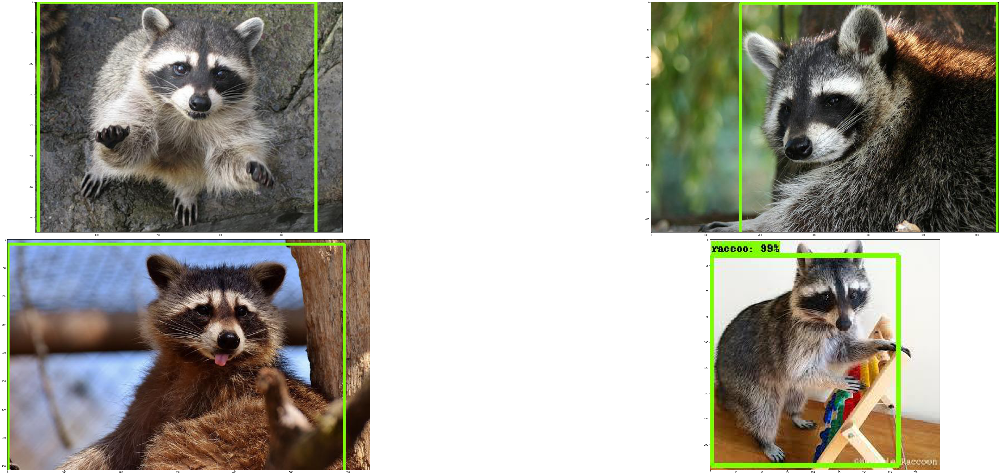

In [43]:
# Visualizing the sample images.
OUTPUT_PATH = 'annotated_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 2 # number of columns in the visualizer grid.
IMAGES = 4 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 10. Deploy! <a class="anchor" id="head-10"></a>

In [44]:
# Export in FP32 mode. 
!mkdir -p $LOCAL_EXPERIMENT_DIR/export
!tao efficientdet export -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.tlt \
                         -o $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.etlt \
                         -k $KEY \
                         -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                         --data_type fp32 \
                         --engine_file $USER_EXPERIMENT_DIR/export/model.step-$NUM_STEP.engine

2021-12-23 11:01:53,574 [INFO] root: Registry: ['nvcr.io']
2021-12-23 11:01:53,619 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-23 11:01:53,654 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/numba/cuda/envvars.py:17: NumbaWarning: 
Environment variables with the 'NUMBAPRO' prefix are deprecated and consequently ignored, found use of NUMBAPRO_NVVM=/usr/local/cuda/nvvm/lib64/libnvvm.so.

For more information about alternatives visit: ('http://numba.pydata.org/numba-doc/latest/cuda/overview.html', '#cudatoolkit-lookup')

In [45]:
# Export in INT8 mode. 
!mkdir -p $LOCAL_EXPERIMENT_DIR/export_int8
# Uncomment to remove existing etlt file
# !rm $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain/model.step-0.etlt
!tao efficientdet export -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.tlt \
                         -o $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.etlt \
                         -k $KEY \
                         -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                         --batch_size 8 \
                         --data_type int8 \
                         --cal_image_dir $DATA_DOWNLOAD_DIR/raw-data/val2017 \
                         --batches 10 \
                         --max_batch_size 1 \
                         --cal_cache_file $USER_EXPERIMENT_DIR/export/efficientdet_d0.cal

2021-12-23 11:05:51,794 [INFO] root: Registry: ['nvcr.io']
2021-12-23 11:05:51,843 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-23 11:05:51,880 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/numba/cuda/envvars.py:17: NumbaWarning: 
Environment variables with the 'NUMBAPRO' prefix are deprecated and consequently ignored, found use of NUMBAPRO_NVVM=/usr/local/cuda/nvvm/lib64/libnvvm.so.

For more information about alternatives visit: ('http://numba.pydata.org/numba-doc/latest/cuda/overview.html', '#cudatoolkit-lookup')

In [46]:
# Check if etlt model is correctly saved.
!ls -l $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain/

total 1171200
-rw-r--r-- 1 root root 75241197 Dec 22 17:31 events.out.tfevents.1640157872.180b5bf5fcd6
-rw-r--r-- 1 root root 38133107 Dec 22 16:24 graph.pbtxt
-rw-r--r-- 1 root root   688702 Dec 22 17:31 log.json
-rw-r--r-- 1 root root 66843202 Dec 22 16:25 model.step-0.tlt
-rw-r--r-- 1 root root 66843279 Dec 22 16:50 model.step-11022.tlt
-rw-r--r-- 1 root root 66843279 Dec 22 16:55 model.step-12859.tlt
-rw-r--r-- 1 root root 66843278 Dec 22 16:59 model.step-14696.tlt
-rw-r--r-- 1 root root 66843278 Dec 22 17:04 model.step-16533.tlt
-rw-r--r-- 1 root root 66843278 Dec 22 17:08 model.step-18370.tlt
-rw-r--r-- 1 root root 66843286 Dec 22 16:28 model.step-1837.tlt
-rw-r--r-- 1 root root 66843278 Dec 22 17:13 model.step-20207.tlt
-rw-r--r-- 1 root root 66843279 Dec 22 17:17 model.step-22044.tlt
-rw-r--r-- 1 root root 66843323 Dec 22 17:22 model.step-23881.tlt
-rw-r--r-- 1 root root 66843323 Dec 22 17:26 model.step-25718.tlt
-rw-r--r-- 1 root root 15665954 Dec 23 11:02 model.step-27555.etl

Verify engine generation using the `tao-converter` utility included with the docker.

The `tao-converter` produces optimized tensorrt engines for the platform that it resides on. Therefore, to get maximum performance, please instantiate this docker and execute the `tao-converter` command, with the exported `.etlt` file and calibration cache (for int8 mode) on your target device. The tao-converter utility included in this docker only works for x86 devices, with discrete NVIDIA GPU's. 

For the jetson devices, please download the tao-converter for jetson from the dev zone link [here](https://developer.nvidia.com/tao-converter). 

If you choose to integrate your model into deepstream directly, you may do so by simply copying the exported `.etlt` file along with the calibration cache to the target device and updating the spec file that configures the `gst-nvinfer` element to point to this newly exported model. Please refer to [deepstream dev guide](https://docs.nvidia.com/metropolis/deepstream/dev-guide/index.html) for more details.

In [47]:
print('Exported model:')
print('------------')
!ls -lth $LOCAL_EXPERIMENT_DIR/export

Exported model:
------------
total 26M
-rw-r--r-- 1 root root 26M Dec 23 11:04 model.step-27555.engine


In [48]:
# Convert to TensorRT engine(FP16).
!tao converter -k $KEY  \
                -p image_arrays:0,1x512x512x3,8x512x512x3,16x512x512x3 \
                -e $USER_EXPERIMENT_DIR/export/trt.fp16.engine \
                -t fp16 \
                $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.etlt

2021-12-23 11:27:12,032 [INFO] root: Registry: ['nvcr.io']
2021-12-23 11:27:12,074 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-23 11:27:12,106 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
[INFO] [MemUsageChange] Init CUDA: CPU +332, GPU +0, now: CPU 338, GPU 1019 (MiB)
[INFO] ----------------------------------------------------------------
[INFO] Input filename:   /tmp/fileV17yOT
[INFO] ONNX IR version:  0.0.7
[INFO] Opset version:    13
[INFO] Producer name:    
[INFO] Producer version: 
[INFO] Domain:           
[INFO] Model version:    0
[INFO] Doc string:       
[INFO] ----

In [49]:
# Convert to TensorRT engine(INT8).
!tao converter -k $KEY  \
               -c $USER_EXPERIMENT_DIR/export/trt.int8.cal \
               -p image_arrays:0,1x512x512x3,8x512x512x3,16x512x512x3 \
               -e $USER_EXPERIMENT_DIR/export/trt.int8.engine \
               -t int8 \
               -b 8 \
               $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.etlt

2021-12-23 11:36:42,000 [INFO] root: Registry: ['nvcr.io']
2021-12-23 11:36:42,040 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-23 11:36:42,071 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
[INFO] [MemUsageChange] Init CUDA: CPU +332, GPU +0, now: CPU 338, GPU 987 (MiB)
[INFO] ----------------------------------------------------------------
[INFO] Input filename:   /tmp/fileFuG0fX
[INFO] ONNX IR version:  0.0.7
[INFO] Opset version:    13
[INFO] Producer name:    
[INFO] Producer version: 
[INFO] Domain:           
[INFO] Model version:    0
[INFO] Doc string:       
[INFO] -----

In [50]:
print('Exported engine:')
print('------------')
!ls -lh $LOCAL_EXPERIMENT_DIR/export/

Exported engine:
------------
total 45M
-rw-r--r-- 1 root root 26M Dec 23 11:04 model.step-27555.engine
-rw-r--r-- 1 root root 19M Dec 23 11:36 trt.fp16.engine


## 11. Verify the deployed model <a class="anchor" id="head-11"></a>

Verify the converted engine by visualizing TensorRT inferences.

In [52]:
# Running inference for detection on a dir of images
!tao efficientdet inference -i $DATA_DOWNLOAD_DIR/raw-data/test \
                         -o $USER_EXPERIMENT_DIR/trt_annotated_images \
                         -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                         -m $USER_EXPERIMENT_DIR/export/model.step-$NUM_STEP.engine \
                         -l $USER_EXPERIMENT_DIR/trt_annotated_labels \
                         --label_map $SPECS_DIR/coco_labels.txt

2021-12-23 12:12:00,616 [INFO] root: Registry: ['nvcr.io']
2021-12-23 12:12:00,660 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2021-12-23 12:12:00,690 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/jeongho/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_retrain.txt
2021-12-23 03:12:05,690 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/myRaccoon/specs/efficientdet_d0_retrain.txt
Finished Processing / 17
Exception ignored in: <bound method TensorRTInfer.__

In [53]:
!ls -l $LOCAL_EXPERIMENT_DIR/trt_annotated_images

total 4964
-rw-r--r-- 1 root root 478492 Dec 23 12:12 raccoon-57_jpg.rf.9a1351ac4447ff21d4390fd8e323e7bf.png
-rw-r--r-- 1 root root  79680 Dec 23 12:12 raccoon-58_jpg.rf.d06ce184082977965e0659f0444ed3c9.png
-rw-r--r-- 1 root root 485497 Dec 23 12:12 raccoon-59_jpg.rf.079100ee6a52181388c3677744a5c16a.png
-rw-r--r-- 1 root root  56734 Dec 23 12:12 raccoon-60_jpg.rf.ee59d00b346bda9929f905defbf367ee.png
-rw-r--r-- 1 root root 109458 Dec 23 12:12 raccoon-61_jpg.rf.3b2ab56ca1eccdae9144b40b65e0e23b.png
-rw-r--r-- 1 root root 424190 Dec 23 12:12 raccoon-62_jpg.rf.a055b6e5102faea5fa404472bbc7a5fc.png
-rw-r--r-- 1 root root 533248 Dec 23 12:12 raccoon-63_jpg.rf.ee21dbec555f80345f8537eac0e37c3d.png
-rw-r--r-- 1 root root  92982 Dec 23 12:12 raccoon-64_jpg.rf.47ce5bdc84c74f8c705fd2c74aede4b2.png
-rw-r--r-- 1 root root 609539 Dec 23 12:12 raccoon-66_jpg.rf.10d9d5caae920c4440eb3dafad353391.png
-rw-r--r-- 1 root root 114166 Dec 23 12:12 raccoon-67_jpg.rf.0a88464512e6367068c9fa4c239fe2b4.png
-rw-r--r-

In [60]:
# Simple grid visualizer
!pip3 install matplotlib==3.3.3
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.png']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['LOCAL_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


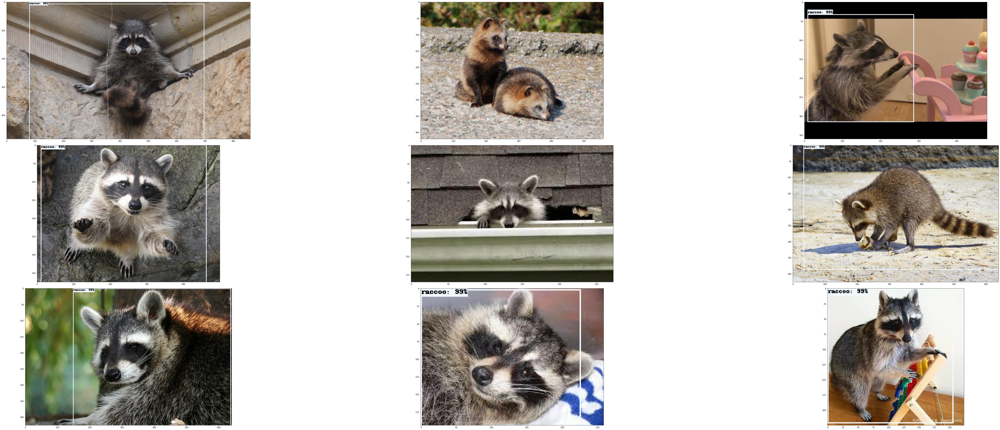

In [62]:
# Visualizing the sample images.
OUTPUT_PATH = 'trt_annotated_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 3 # number of columns in the visualizer grid.
IMAGES = 9 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)